# IC3392 GAS pairwise Flux/Error cut test

Focus only on `v768_9100_40` versus the old `v721_7000_53` reference.

- x axis: `old_v721_7000`, `7.2.1 7000/53`
- y axis: `v768_9100_40`, `7.6.8 9100/40`
- gas lines: `OIII5006`, `HA6562`, `NII6583`, `SII6716`
- each figure: 4 rows by 2 columns, with pairwise scatter on the left and residuals on the right

The second plot set applies the same line-level `FLUX / FLUX_ERR` cut to both runs before plotting `FLUX`, `VEL`, and `SIGMA`.


In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from astropy.io import fits

pd.set_option('display.max_columns', 140)
pd.set_option('display.max_rows', 240)
pd.set_option('display.max_colwidth', 160)

plt.rcParams.update({
    'figure.dpi': 130,
    'savefig.dpi': 160,
    'axes.grid': False,
})

root = Path.cwd()
GALAXY = 'IC3392'

RUNS = {
    'old_v721_7000': {
        'label': 'v3_v7.2.1 old CONFIG to 7000; VELSCALE=53',
        'plot_label': '7.2.1 7000/53',
        'gas_path': root / 'v3_v7.2.1' / GALAXY / f'{GALAXY}_gas_BIN_maps.fits',
    },
    'v768_9100_40': {
        'label': 'v3tk_v7.6.8 full red setup to 9100; VELSCALE=40',
        'plot_label': '7.6.8 9100/40',
        'gas_path': root / 'v3tk_v7.6.8_VELSCALE40' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
    },
}

BASELINE_RUN = 'old_v721_7000'
COMPARE_RUN = 'v768_9100_40'
RUN_ORDER = [BASELINE_RUN, COMPARE_RUN]

LINE_SPECS = [
    ('OIII5006', 'OIII5006'),
    ('HA6562', 'Halpha 6562'),
    ('NII6583', 'NII 6583'),
    ('SII6716', 'SII 6716'),
]
LINE_ORDER = [line for line, label in LINE_SPECS]
LINE_LABELS = dict(LINE_SPECS)

QUANTITIES = ['FLUX', 'VEL', 'SIGMA']
FLUXERR_CUTS = [0, 3, 5, 10, 20, 50]
CUT_COLORS = {
    0: '#7f7f7f',
    3: '#1f77b4',
    5: '#2ca02c',
    10: '#ff7f0e',
    20: '#9467bd',
    50: '#d62728',
}
NO_CUT_COLOR = '#1f77b4'

run_table = []
for run_key, run in RUNS.items():
    gas_path = run['gas_path']
    run_table.append({
        'run_key': run_key,
        'label': run['label'],
        'gas_path': str(gas_path.relative_to(root)),
        'gas_exists': gas_path.exists(),
        'gas_size_MB': gas_path.stat().st_size / 1024**2 if gas_path.exists() else np.nan,
    })
run_table = pd.DataFrame(run_table)
display(run_table)

assert run_table['gas_exists'].all(), 'At least one GAS map file is missing.'


,run_key,label,gas_path,gas_exists,gas_size_MB
0,old_v721_7000,v3_v7.2.1 old CONFIG to 7000; VELSCALE=53,v3_v7.2.1/IC3392/IC3392_gas_BIN_maps.fits,True,152.251282
1,v768_9100_40,v3tk_v7.6.8 full red setup to 9100; VELSCALE=40,v3tk_v7.6.8_VELSCALE40/IC3392/IC3392_gas_bin_maps.fits,True,223.983765


## Load Maps


In [2]:
def fits_extnames(path):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        return [hdu.name for hdu in hdul]


def read_map(path, extname):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def align_map_set(map_by_run, label=None):
    shapes = {run_key: arr.shape for run_key, arr in map_by_run.items()}
    unique_shapes = set(shapes.values())
    if len(unique_shapes) == 1:
        return map_by_run

    common_shape = tuple(min(shape[axis] for shape in unique_shapes) for axis in range(len(next(iter(unique_shapes)))))
    slices = tuple(slice(0, n) for n in common_shape)
    print(f'Warning: {label or "map"} shape mismatch {shapes}; using common crop {common_shape}.')
    return {run_key: arr[slices] for run_key, arr in map_by_run.items()}


needed_extensions = [
    f'{line}_{suffix}'
    for line in LINE_ORDER
    for suffix in ['FLUX', 'FLUX_ERR', 'VEL', 'SIGMA', 'SIGMA_CORR']
]

availability_rows = []
for run_key in RUN_ORDER:
    extnames = set(fits_extnames(RUNS[run_key]['gas_path']))
    missing = [ext for ext in needed_extensions if ext not in extnames]
    availability_rows.append({
        'run_key': run_key,
        'n_extensions': len(extnames),
        'missing_required_extensions': ', '.join(missing),
        'all_required_available': len(missing) == 0,
    })
availability = pd.DataFrame(availability_rows)
display(availability)
assert availability['all_required_available'].all(), 'Required GAS extensions are missing.'

maps = {}
for line in LINE_ORDER:
    for suffix in ['FLUX', 'FLUX_ERR', 'VEL', 'SIGMA', 'SIGMA_CORR']:
        extname = f'{line}_{suffix}'
        maps[extname] = align_map_set(
            {run_key: read_map(RUNS[run_key]['gas_path'], extname) for run_key in RUN_ORDER},
            extname,
        )

shape_rows = []
for extname, by_run in maps.items():
    for run_key, arr in by_run.items():
        shape_rows.append({'extension': extname, 'run_key': run_key, 'shape': arr.shape})
shape_table = pd.DataFrame(shape_rows)
display(shape_table.pivot_table(index='extension', columns='run_key', values='shape', aggfunc='first'))


,run_key,n_extensions,missing_required_extensions,all_required_available
0,old_v721_7000,105,,True
1,v768_9100_40,154,,True


run_key,old_v721_7000,v768_9100_40
extension,,
HA6562_FLUX,"(438, 437)","(438, 437)"
HA6562_FLUX_ERR,"(438, 437)","(438, 437)"
HA6562_SIGMA,"(438, 437)","(438, 437)"
HA6562_SIGMA_CORR,"(438, 437)","(438, 437)"
HA6562_VEL,"(438, 437)","(438, 437)"
NII6583_FLUX,"(438, 437)","(438, 437)"
NII6583_FLUX_ERR,"(438, 437)","(438, 437)"
NII6583_SIGMA,"(438, 437)","(438, 437)"
NII6583_SIGMA_CORR,"(438, 437)","(438, 437)"


## Pairwise Helpers

`snr_cut=None` means no `FLUX / FLUX_ERR` cut. Numeric cuts use strict `Flux/Err > cut` in both runs for the same line.


In [3]:
def finite_values(arrays):
    chunks = []
    for arr in arrays:
        vals = np.asarray(arr)[np.isfinite(arr)]
        if vals.size:
            chunks.append(vals.ravel())
    if not chunks:
        return np.array([], dtype=float)
    return np.concatenate(chunks)


def robust_limits(values, p=(1, 99), fallback=(-1.0, 1.0), pad_fraction=0.05):
    values = np.asarray(values)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return fallback
    lo, hi = np.nanpercentile(values, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        center = np.nanmedian(values)
        spread = np.nanstd(values)
        spread = spread if np.isfinite(spread) and spread > 0 else 1.0
        lo, hi = center - spread, center + spread
    pad = pad_fraction * (hi - lo) if hi > lo else 1.0
    return float(lo - pad), float(hi + pad)


def robust_symmetric_limit(values, percentile=98, fallback=1.0):
    values = np.asarray(values)
    values = np.abs(values[np.isfinite(values)])
    if values.size == 0:
        return float(fallback)
    limit = np.nanpercentile(values, percentile)
    if not np.isfinite(limit) or limit <= 0:
        limit = np.nanmax(values)
    if not np.isfinite(limit) or limit <= 0:
        limit = fallback
    return float(limit)


def line_fluxerr(run_key, line):
    flux = maps[f'{line}_FLUX'][run_key]
    err = maps[f'{line}_FLUX_ERR'][run_key]
    ratio = np.full(flux.shape, np.nan, dtype=float)
    mask = np.isfinite(flux) & np.isfinite(err) & (err > 0)
    ratio[mask] = flux[mask] / err[mask]
    return ratio


def fluxerr_mask(line, snr_cut):
    if snr_cut is None:
        return np.ones_like(maps[f'{line}_FLUX'][BASELINE_RUN], dtype=bool)
    baseline_snr = line_fluxerr(BASELINE_RUN, line)
    compare_snr = line_fluxerr(COMPARE_RUN, line)
    return (
        np.isfinite(baseline_snr)
        & np.isfinite(compare_snr)
        & (baseline_snr > snr_cut)
        & (compare_snr > snr_cut)
    )


def pair_arrays(line, quantity, snr_cut=None):
    x_map = maps[f'{line}_{quantity}'][BASELINE_RUN]
    y_map = maps[f'{line}_{quantity}'][COMPARE_RUN]
    mask = np.isfinite(x_map) & np.isfinite(y_map) & fluxerr_mask(line, snr_cut)
    return x_map[mask], y_map[mask], mask


def residual_values(x, y, quantity):
    delta = y - x
    if quantity == 'FLUX':
        residual = np.full(delta.shape, np.nan, dtype=float)
        mask = np.isfinite(delta) & np.isfinite(x) & (x != 0)
        residual[mask] = 100.0 * delta[mask] / np.abs(x[mask])
        return residual
    return delta


def sample_for_plot(x, y, max_points=30000, random_state=12):
    if x.size <= max_points:
        return x, y
    rng = np.random.default_rng(random_state)
    idx = rng.choice(x.size, size=max_points, replace=False)
    return x[idx], y[idx]


def pair_stats(line, quantity, snr_cut=None):
    x, y, mask = pair_arrays(line, quantity, snr_cut)
    record = {
        'line': line,
        'line_label': LINE_LABELS[line],
        'quantity': quantity,
        'fluxerr_cut': 'none' if snr_cut is None else f'>{snr_cut:g}',
        'n_valid': int(x.size),
        'fraction_map': float(x.size / mask.size) if mask.size else np.nan,
        'pearson_r': np.nan,
        'median_residual_compare_minus_reference': np.nan,
        'median_abs_residual': np.nan,
        'p16_residual': np.nan,
        'p84_residual': np.nan,
        'robust_sigma_residual': np.nan,
        'rms_residual': np.nan,
    }
    if x.size == 0:
        return record

    residual = residual_values(x, y, quantity)
    finite_residual = residual[np.isfinite(residual)]
    if finite_residual.size == 0:
        return record
    if x.size > 1 and np.nanstd(x) > 0 and np.nanstd(y) > 0:
        record['pearson_r'] = float(np.corrcoef(x, y)[0, 1])
    record.update({
        'median_residual_compare_minus_reference': float(np.nanmedian(residual)),
        'median_abs_residual': float(np.nanmedian(np.abs(residual))),
        'p16_residual': float(np.nanpercentile(residual, 16)),
        'p84_residual': float(np.nanpercentile(residual, 84)),
        'robust_sigma_residual': float(0.5 * (np.nanpercentile(residual, 84) - np.nanpercentile(residual, 16))),
        'rms_residual': float(np.sqrt(np.nanmean(residual**2))),
    })
    return record


def change_axis_label(quantity):
    if quantity == 'FLUX':
        return 'Changes in Fraction [%]'
    return 'Changes'


def cut_label(snr_cut):
    return 'no Flux/Err cut' if snr_cut is None else f'Flux/Err > {snr_cut:g}'


## No Flux/Error Cut

Three figures below: one each for `FLUX`, `VEL`, and `SIGMA`. Each figure is 4 by 2: pairwise scatter on the left, residual versus reference on the right.


In [4]:
no_cut_summary = pd.DataFrame([
    pair_stats(line, quantity, snr_cut=None)
    for quantity in QUANTITIES
    for line in LINE_ORDER
])
display(no_cut_summary)


,line,line_label,quantity,fluxerr_cut,n_valid,fraction_map,pearson_r,median_residual_compare_minus_reference,median_abs_residual,p16_residual,p84_residual,robust_sigma_residual,rms_residual
0,OIII5006,OIII5006,FLUX,none,72910,0.380918,0.912165,-2.535061,25.085476,-36.404821,41.436309,38.920565,59.641950
1,HA6562,Halpha 6562,FLUX,none,72910,0.380918,0.989229,-9.119257,14.183041,-28.461991,7.263914,17.862953,23.666306
2,NII6583,NII 6583,FLUX,none,72910,0.380918,0.990616,-3.756126,8.049394,-17.092184,7.334521,12.213353,16.374192
3,SII6716,SII 6716,FLUX,none,72910,0.380918,0.990219,-2.582621,11.366000,-20.575223,14.340313,17.457768,22.040358
4,OIII5006,OIII5006,VEL,none,72910,0.380918,0.314793,-5.645645,33.692952,-80.977089,43.023151,62.000120,187.981779
5,HA6562,Halpha 6562,VEL,none,72910,0.380918,0.818226,-3.600872,5.673710,-16.546476,4.035085,10.290781,36.999847
6,NII6583,NII 6583,VEL,none,72910,0.380918,0.976972,-3.756629,4.375137,-11.144017,0.465132,5.804574,11.074945
7,SII6716,SII 6716,VEL,none,72910,0.380918,0.976972,-3.756629,4.375137,-11.144017,0.465132,5.804574,11.074945
8,OIII5006,OIII5006,SIGMA,none,72910,0.380918,0.259024,6.258599,25.703299,-25.857404,91.302002,58.579703,155.983357
9,HA6562,Halpha 6562,SIGMA,none,72910,0.380918,0.757411,-5.094737,7.926856,-35.380450,2.082162,18.731306,37.710170


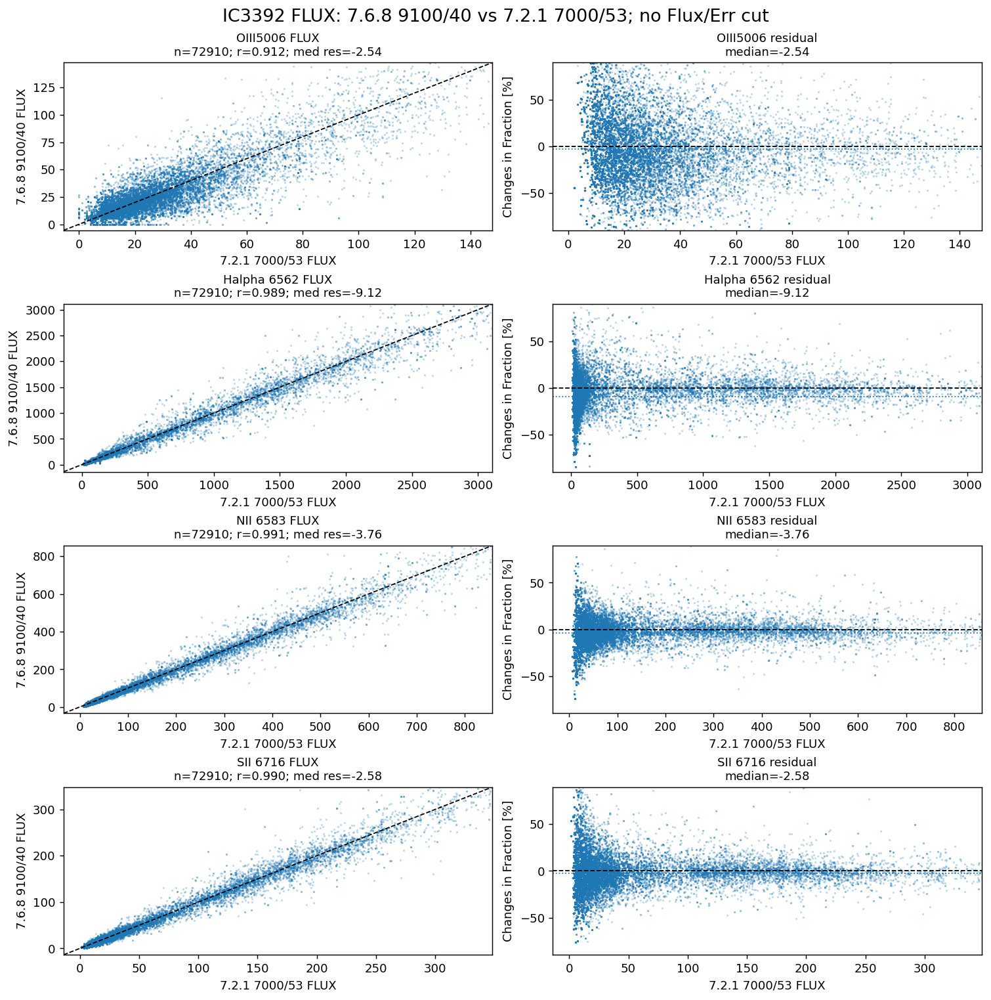

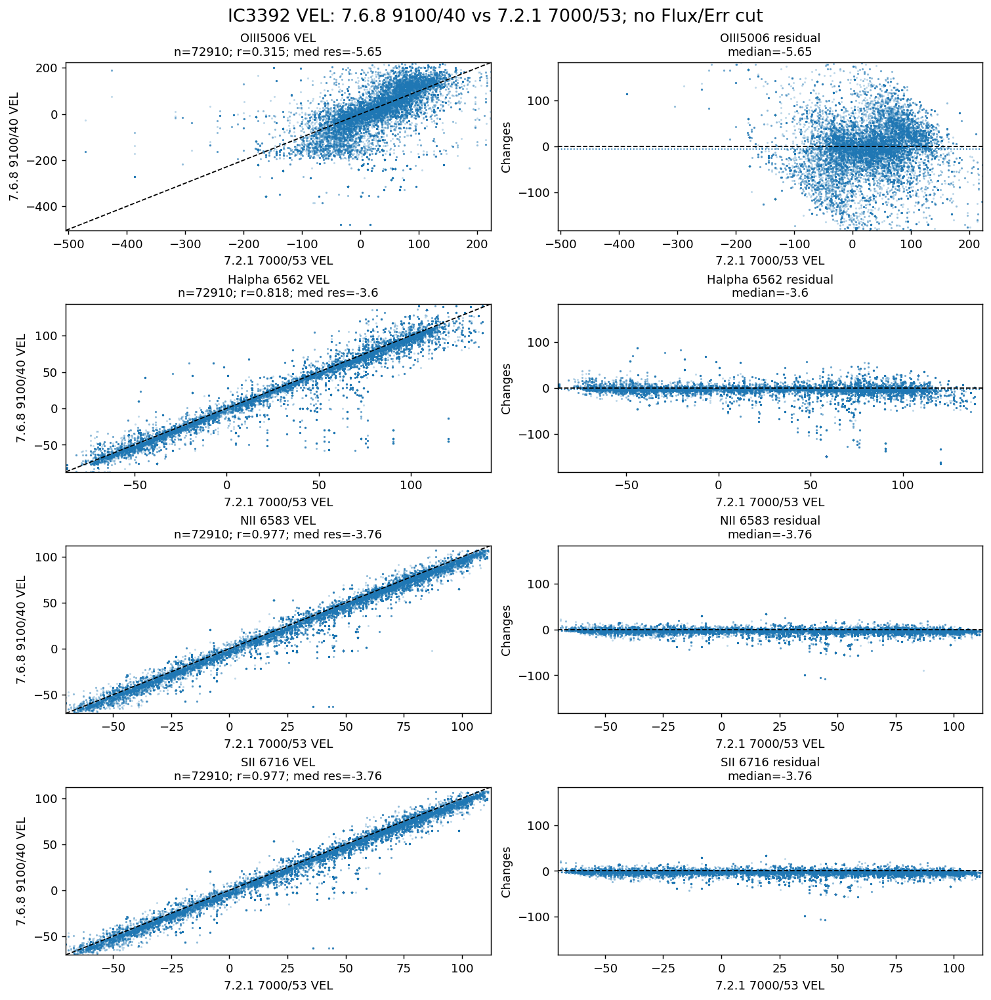

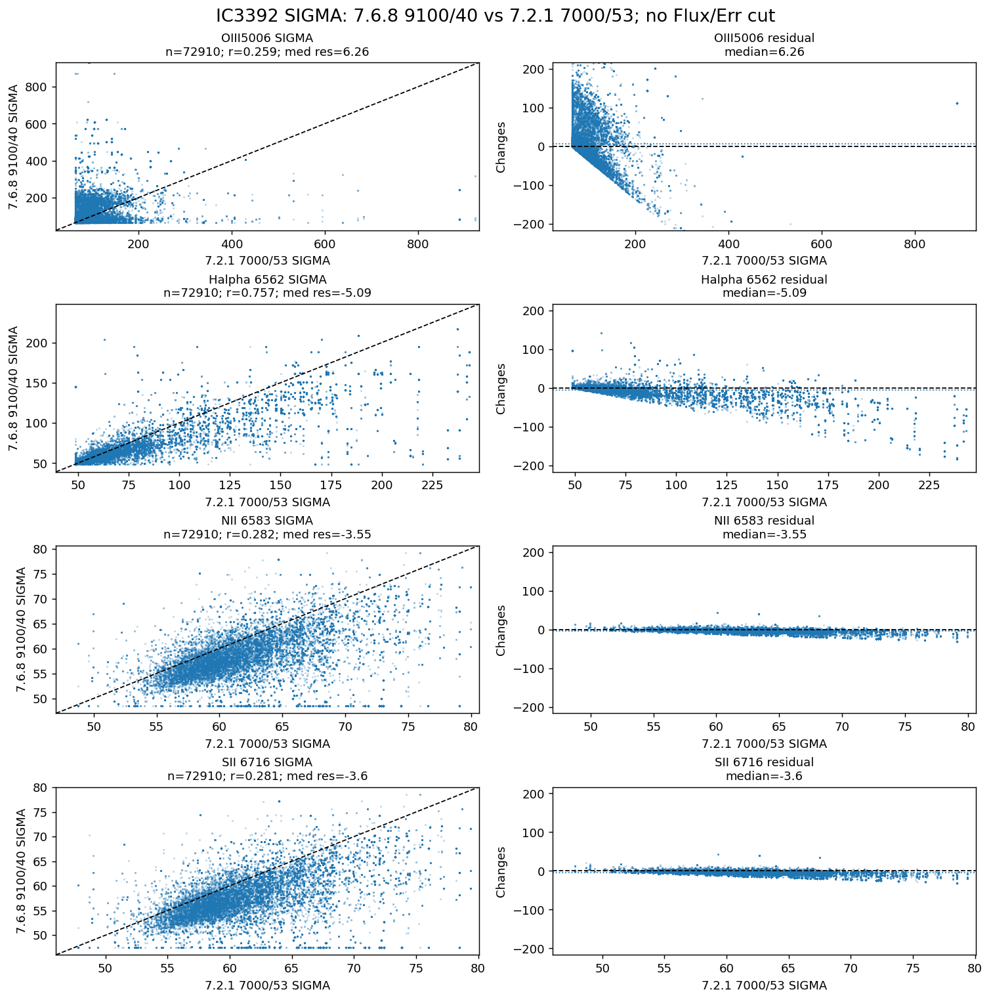

In [5]:
def residual_limit_for(quantity, snr_cuts):
    residuals = []
    for line in LINE_ORDER:
        for snr_cut in snr_cuts:
            x, y, _ = pair_arrays(line, quantity, snr_cut)
            if x.size:
                residuals.append(residual_values(x, y, quantity))
    if quantity == 'FLUX':
        fallback = 1.0
        lower = 1e-6
    elif quantity == 'VEL':
        fallback = 20.0
        lower = 5.0
    else:
        fallback = 20.0
        lower = 5.0
    limit = robust_symmetric_limit(finite_values(residuals), percentile=98, fallback=fallback)
    return max(limit, lower)


def plot_quantity_pairwise(quantity, snr_cut=None, color=NO_CUT_COLOR, max_points=30000, random_state=12):
    residual_limit = residual_limit_for(quantity, [snr_cut])
    fig, axes = plt.subplots(
        len(LINE_ORDER),
        2,
        figsize=(11.5, 2.9 * len(LINE_ORDER)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle(
        f'IC3392 {quantity}: {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}; {cut_label(snr_cut)}',
        fontsize=15,
    )

    for row, line in enumerate(LINE_ORDER):
        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]
        x, y, _ = pair_arrays(line, quantity, snr_cut)
        stats = pair_stats(line, quantity, snr_cut)

        if x.size == 0:
            scatter_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            residual_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        px, py = sample_for_plot(x, y, max_points=max_points, random_state=random_state + row)
        pres = residual_values(px, py, quantity)
        all_residual = residual_values(x, y, quantity)
        lo, hi = robust_limits(np.r_[x, y], p=(1, 99))

        scatter_ax.scatter(px, py, s=3, alpha=0.28, linewidths=0, color=color)
        scatter_ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lo, hi)
        scatter_ax.set_ylim(lo, hi)
        scatter_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_ylabel(f'{RUNS[COMPARE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_title(
            f'{LINE_LABELS[line]} {quantity}\n'
            f'n={stats["n_valid"]}; r={stats["pearson_r"]:.3f}; med res={stats["median_residual_compare_minus_reference"]:.3g}',
            fontsize=10,
        )

        residual_ax.scatter(px, pres, s=3, alpha=0.28, linewidths=0, color=color)
        residual_ax.axhline(0.0, color='black', linestyle='--', linewidth=1)
        residual_ax.axhline(np.nanmedian(all_residual), color=color, linestyle=':', linewidth=1)
        residual_ax.set_xlim(lo, hi)
        residual_ax.set_ylim(-residual_limit, residual_limit)
        residual_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        residual_ax.set_ylabel(change_axis_label(quantity))
        residual_ax.set_title(f'{LINE_LABELS[line]} residual\nmedian={np.nanmedian(all_residual):.3g}', fontsize=10)

    plt.show()


for quantity in QUANTITIES:
    plot_quantity_pairwise(quantity, snr_cut=None, color=NO_CUT_COLOR, random_state=40)


## Flux/Error Cut Overplots

The next three figures overplot `Flux/Err > 0`, `> 3`, `> 5`, `> 10`, `> 20`, and `> 50` in different colors. The cut is applied to both runs for the same gas line before plotting each quantity.


In [6]:
cut_summary = pd.DataFrame([
    pair_stats(line, quantity, snr_cut=cut)
    for quantity in QUANTITIES
    for line in LINE_ORDER
    for cut in FLUXERR_CUTS
])
display(cut_summary)


,line,line_label,quantity,fluxerr_cut,n_valid,fraction_map,pearson_r,median_residual_compare_minus_reference,median_abs_residual,p16_residual,p84_residual,robust_sigma_residual,rms_residual
0,OIII5006,OIII5006,FLUX,>0,71914,0.375714,0.913092,-1.958369,24.789230,-35.056540,42.091556,38.574048,59.027411
1,OIII5006,OIII5006,FLUX,>3,68258,0.356614,0.919828,-0.193466,23.430440,-31.461020,42.166621,36.813821,49.889248
2,OIII5006,OIII5006,FLUX,>5,59584,0.311296,0.930839,0.915386,21.700741,-28.370695,39.773536,34.072116,43.713153
3,OIII5006,OIII5006,FLUX,>10,23206,0.121240,0.958424,2.761931,17.308283,-20.861120,32.573549,26.717335,38.007392
4,OIII5006,OIII5006,FLUX,>20,986,0.005151,0.965953,8.872381,10.008733,-14.394350,28.739925,21.567137,23.618337
5,OIII5006,OIII5006,FLUX,>50,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,HA6562,Halpha 6562,FLUX,>0,72910,0.380918,0.989229,-9.119257,14.183041,-28.461991,7.263914,17.862953,23.666306
7,HA6562,Halpha 6562,FLUX,>3,72910,0.380918,0.989229,-9.119257,14.183041,-28.461991,7.263914,17.862953,23.666306
8,HA6562,Halpha 6562,FLUX,>5,72910,0.380918,0.989229,-9.119257,14.183041,-28.461991,7.263914,17.862953,23.666306
9,HA6562,Halpha 6562,FLUX,>10,72443,0.378478,0.989215,-9.137322,14.183041,-28.396633,7.234330,17.815481,23.534308


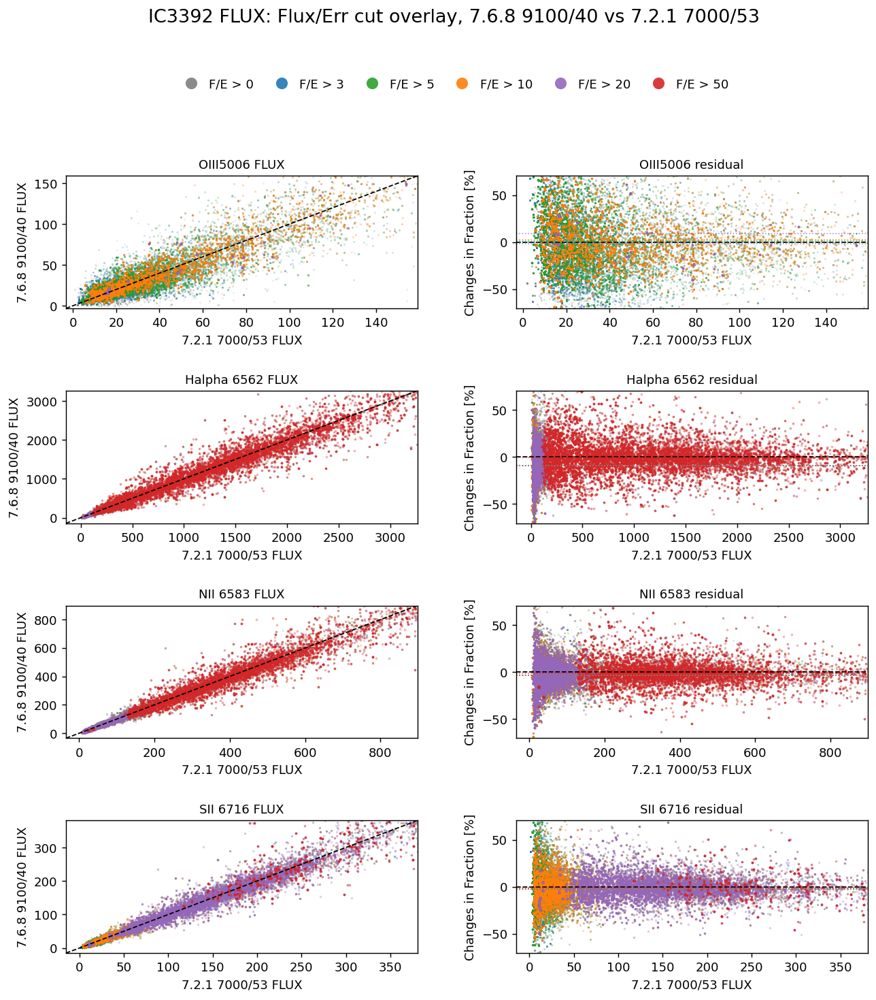

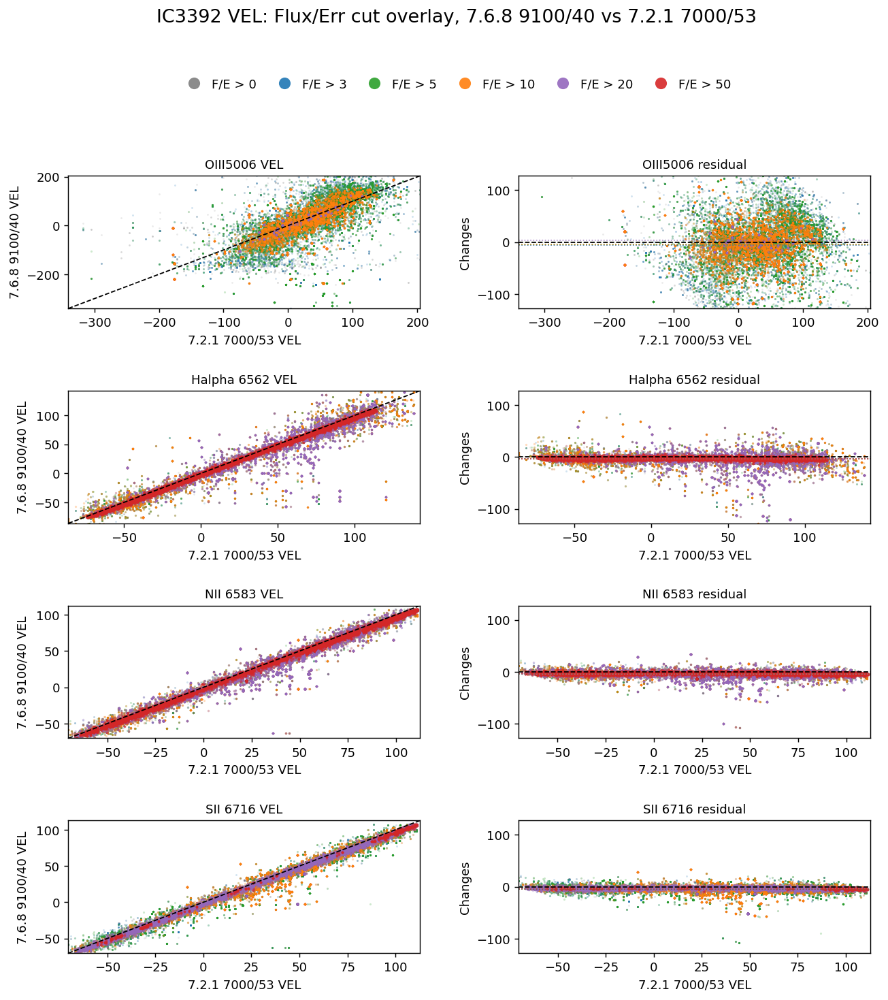

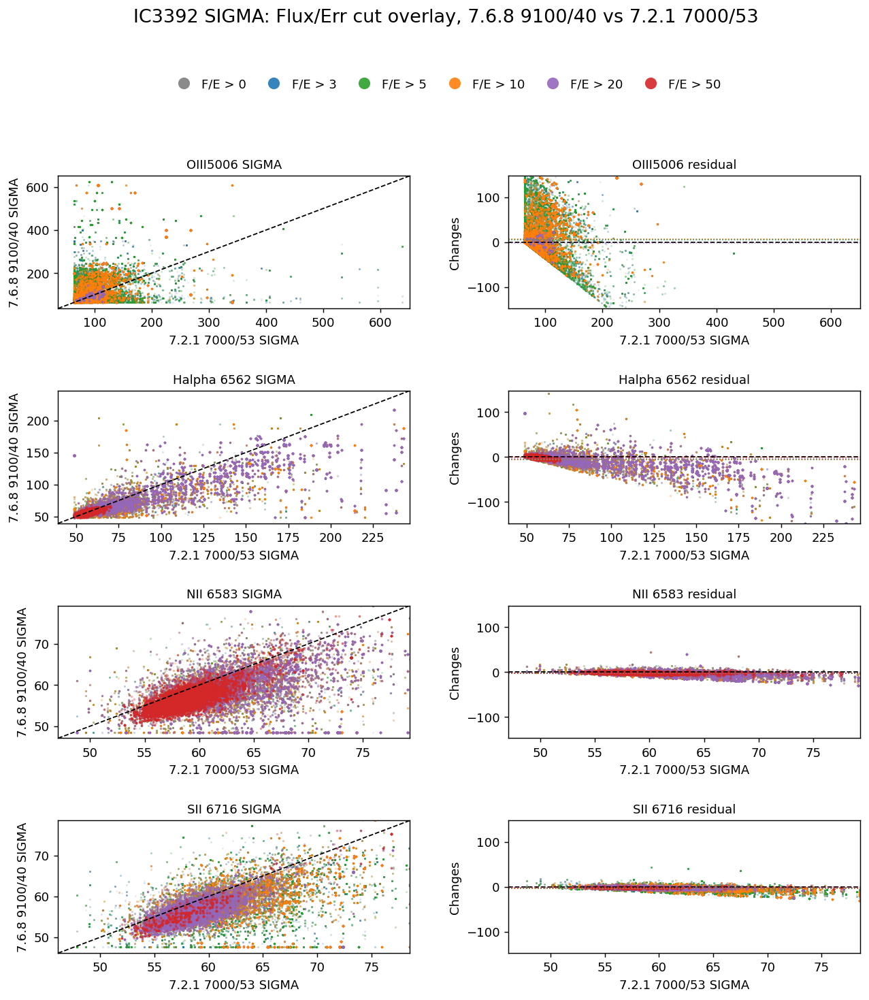

In [7]:
def plot_quantity_fluxerr_cut_overlay(quantity, snr_cuts=FLUXERR_CUTS, max_points=18000, random_state=80):
    from matplotlib.lines import Line2D

    residual_limit = residual_limit_for(quantity, snr_cuts)
    fig, axes = plt.subplots(
        len(LINE_ORDER),
        2,
        figsize=(11.7, 3.05 * len(LINE_ORDER)),
        squeeze=False,
        constrained_layout=False,
    )
    fig.suptitle(
        f'IC3392 {quantity}: Flux/Err cut overlay, {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}',
        fontsize=15,
        y=0.985,
    )
    fig.subplots_adjust(top=0.83, hspace=0.62, wspace=0.28)

    legend_handles = [
        Line2D([0], [0], marker='o', linestyle='None', color='none',
               markerfacecolor=CUT_COLORS[cut], markeredgewidth=0,
               markersize=9.5, alpha=0.9)
        for cut in snr_cuts
    ]
    legend_labels = [f'F/E > {cut:g}' for cut in snr_cuts]
    for row, line in enumerate(LINE_ORDER):
        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]

        all_x = []
        all_y = []
        for cut in snr_cuts:
            x, y, _ = pair_arrays(line, quantity, cut)
            if x.size:
                all_x.append(x)
                all_y.append(y)
        if not all_x:
            scatter_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            residual_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        lo, hi = robust_limits(np.r_[finite_values(all_x), finite_values(all_y)], p=(1, 99))
        scatter_ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1)
        residual_ax.axhline(0.0, color='black', linestyle='--', linewidth=1)

        for cut_index, cut in enumerate(snr_cuts):
            color = CUT_COLORS[cut]
            x, y, _ = pair_arrays(line, quantity, cut)
            if x.size == 0:
                continue
            px, py = sample_for_plot(x, y, max_points=max_points, random_state=random_state + 17 * row + cut_index)
            pres = residual_values(px, py, quantity)
            all_residual = residual_values(x, y, quantity)
            alpha = 0.16 + 0.035 * cut_index
            size = 2.3 + 0.35 * cut_index

            scatter_ax.scatter(px, py, s=size, alpha=alpha, linewidths=0, color=color)
            residual_ax.scatter(px, pres, s=size, alpha=alpha, linewidths=0, color=color)
            residual_ax.axhline(np.nanmedian(all_residual), color=color, linestyle=':', linewidth=0.9, alpha=0.75)

        scatter_ax.set_xlim(lo, hi)
        scatter_ax.set_ylim(lo, hi)
        scatter_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_ylabel(f'{RUNS[COMPARE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_title(f'{LINE_LABELS[line]} {quantity}', fontsize=10)

        residual_ax.set_xlim(lo, hi)
        residual_ax.set_ylim(-residual_limit, residual_limit)
        residual_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        residual_ax.set_ylabel(change_axis_label(quantity))
        residual_ax.set_title(f'{LINE_LABELS[line]} residual', fontsize=10)

    fig.legend(
        legend_handles,
        legend_labels,
        loc='upper center',
        ncol=len(legend_labels),
        bbox_to_anchor=(0.5, 0.925),
        frameon=False,
        handletextpad=0.45,
        columnspacing=1.25,
        borderaxespad=0.0,
    )
    plt.show()


for quantity in QUANTITIES:
    plot_quantity_fluxerr_cut_overlay(quantity, snr_cuts=FLUXERR_CUTS, random_state=90)


## Individual Flux/Error Cut Figures

Each cell below makes the same 4 by 2 figures as the no-cut section, but with one `Flux/Err` threshold at a time. Each cut produces three figures: `FLUX`, `VEL`, and `SIGMA`.


Individual plots: Flux/Err > 0


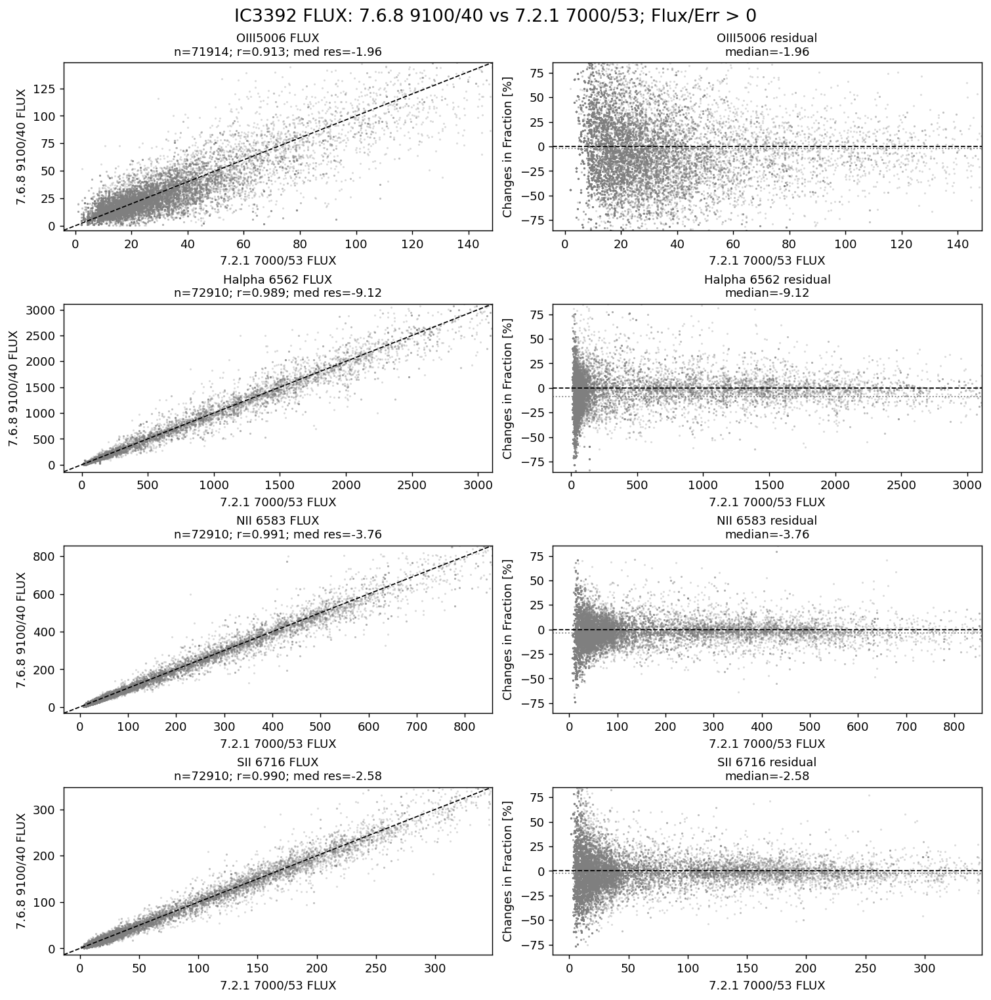

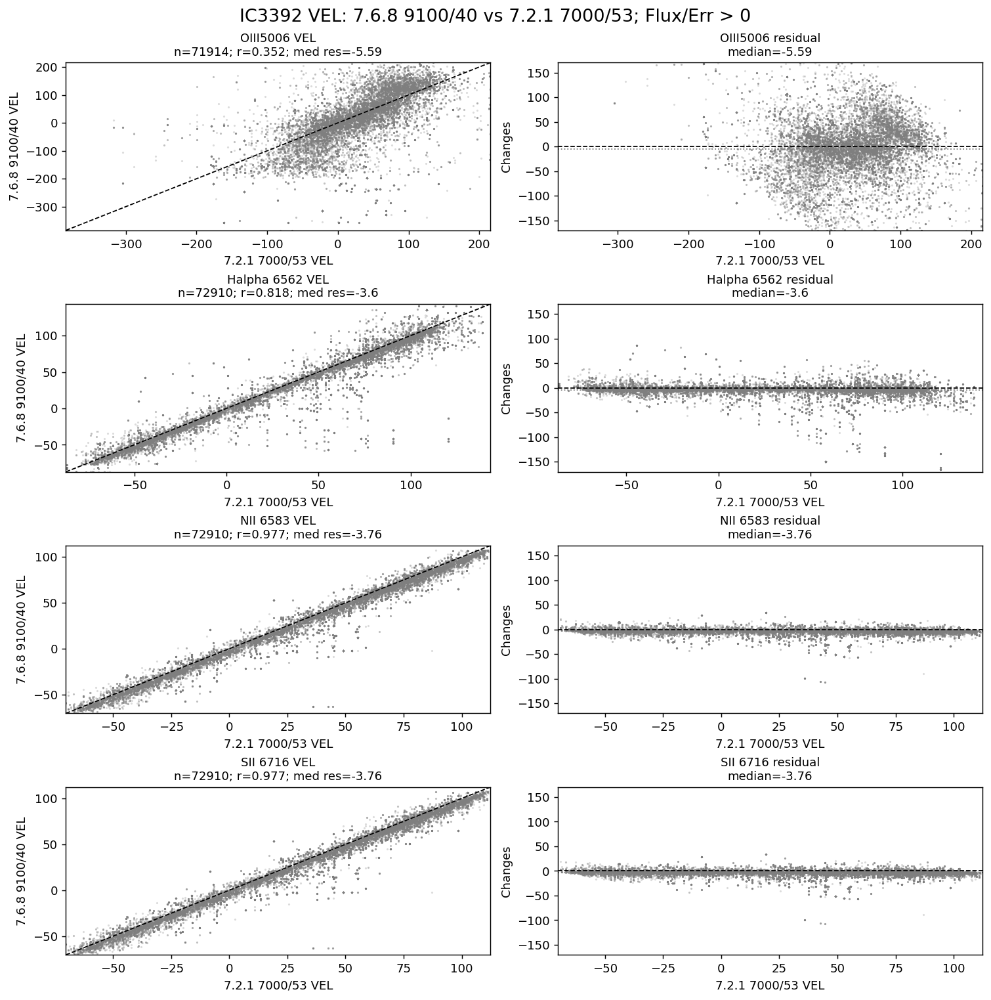

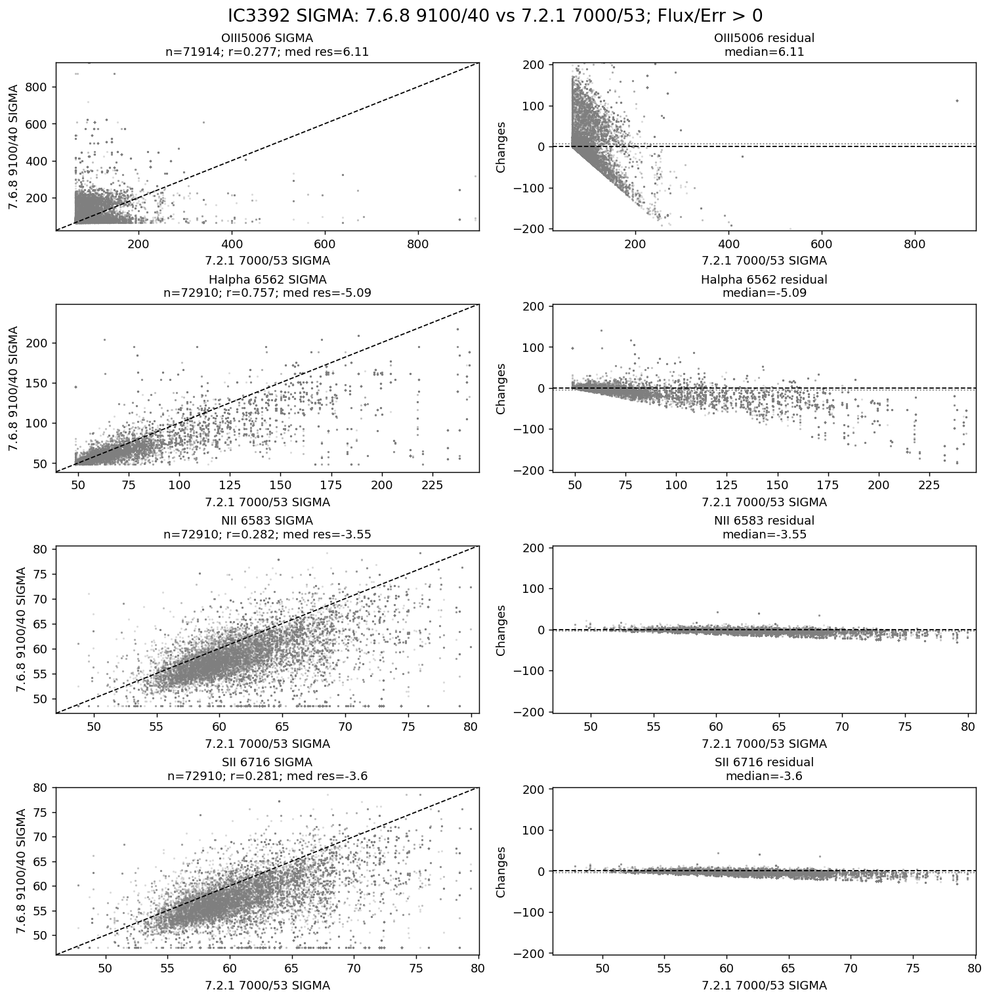

In [8]:
INDIVIDUAL_FLUXERR_CUT = 0
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 3


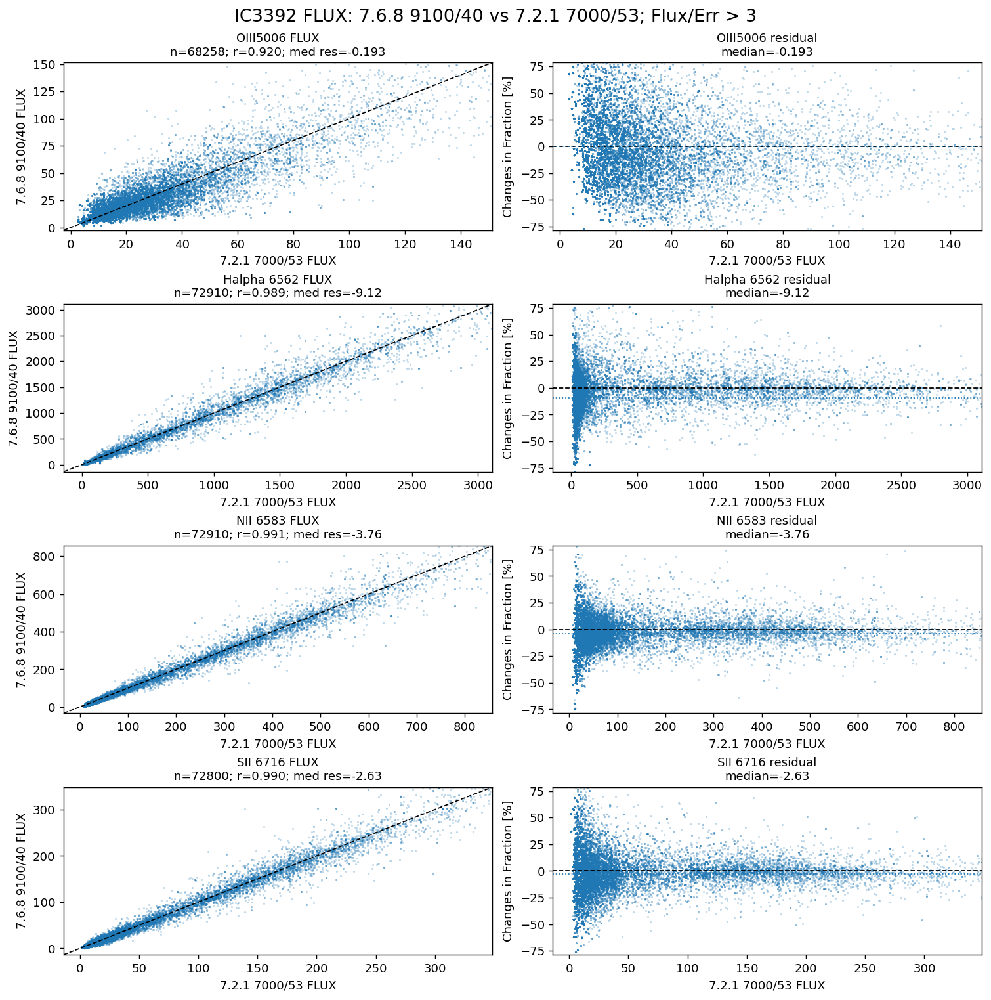

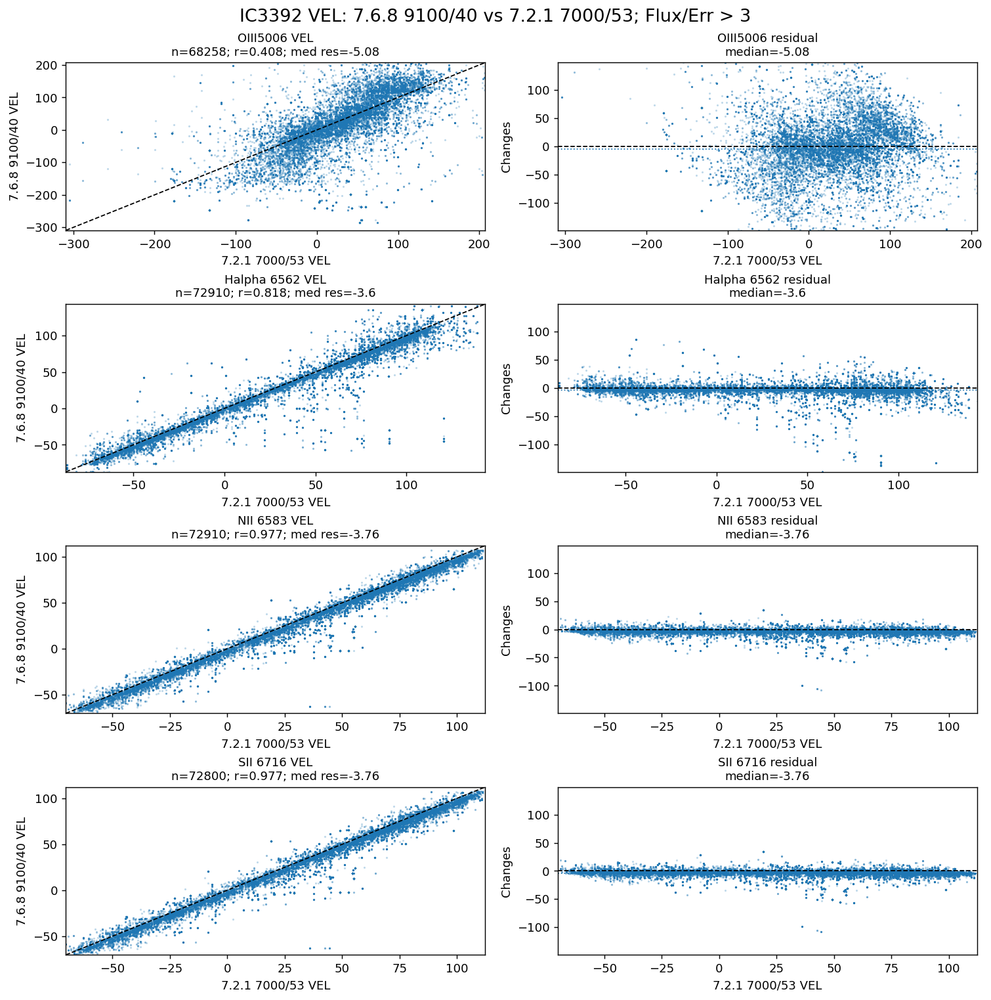

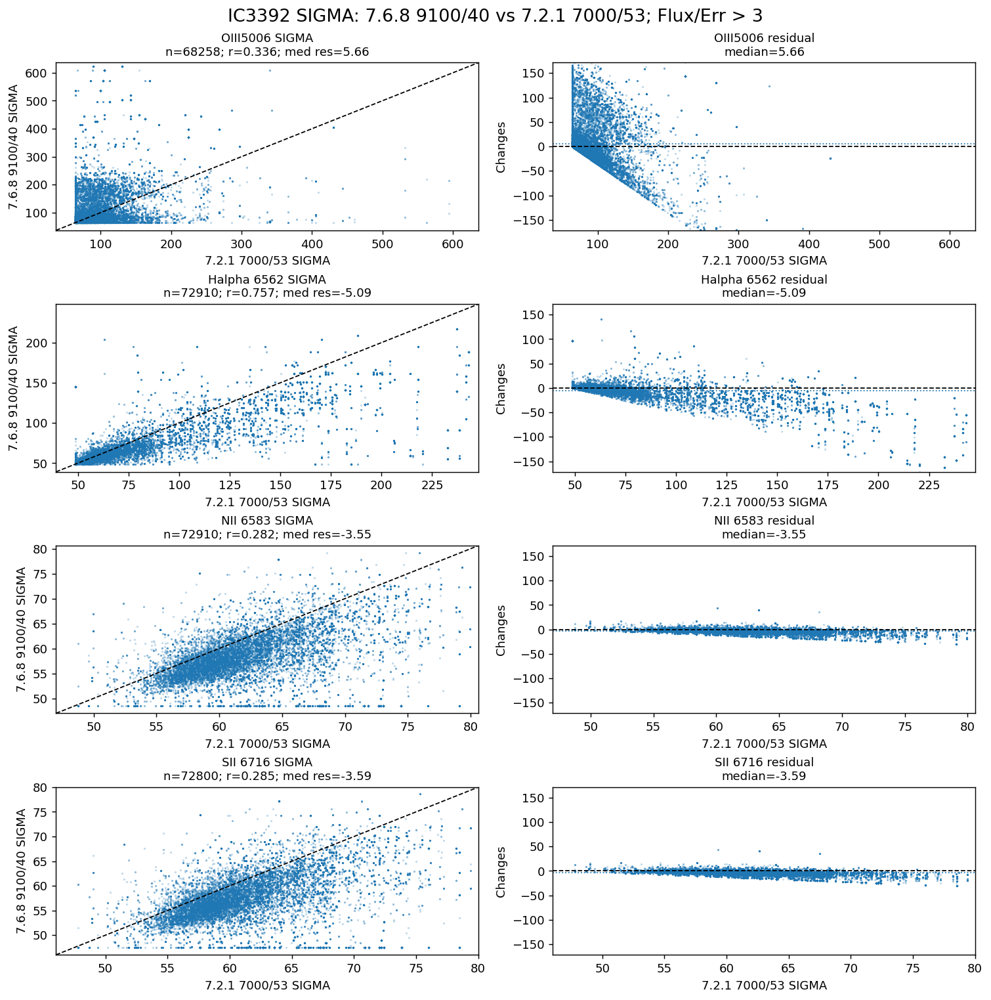

In [9]:
INDIVIDUAL_FLUXERR_CUT = 3
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 5


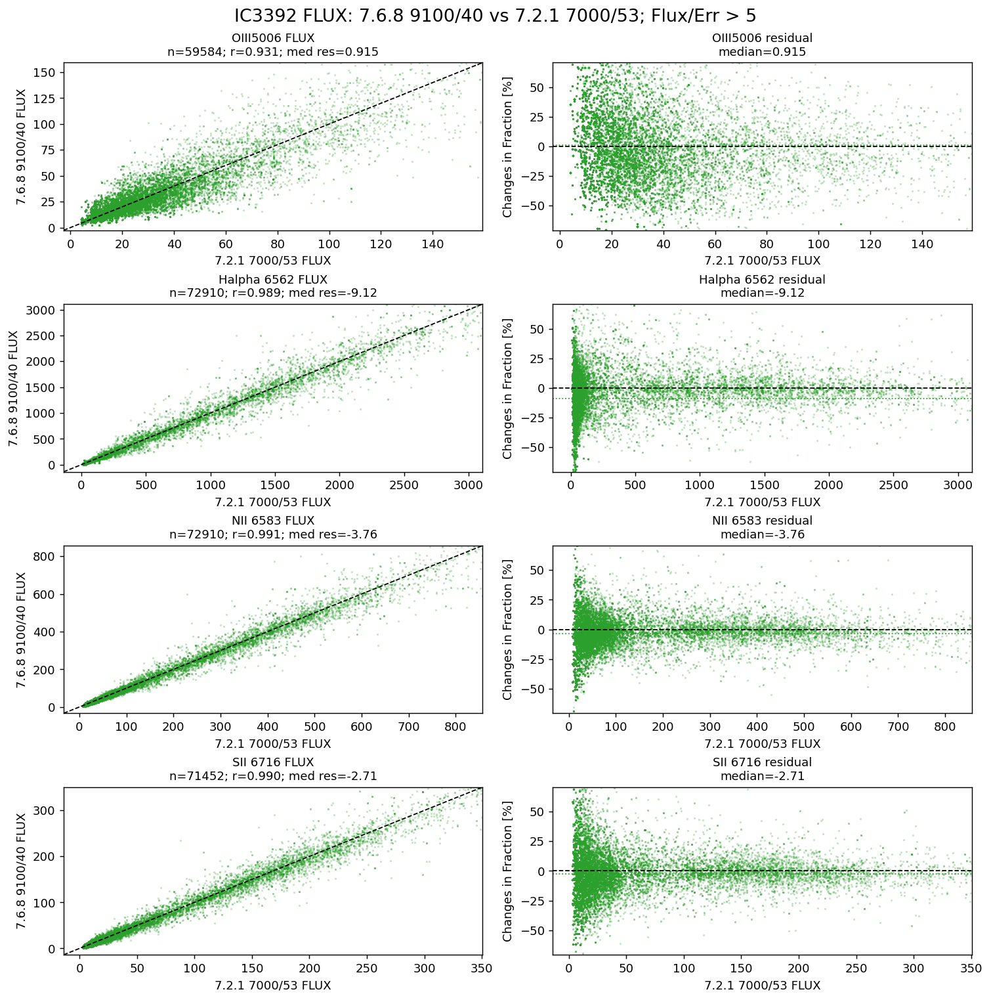

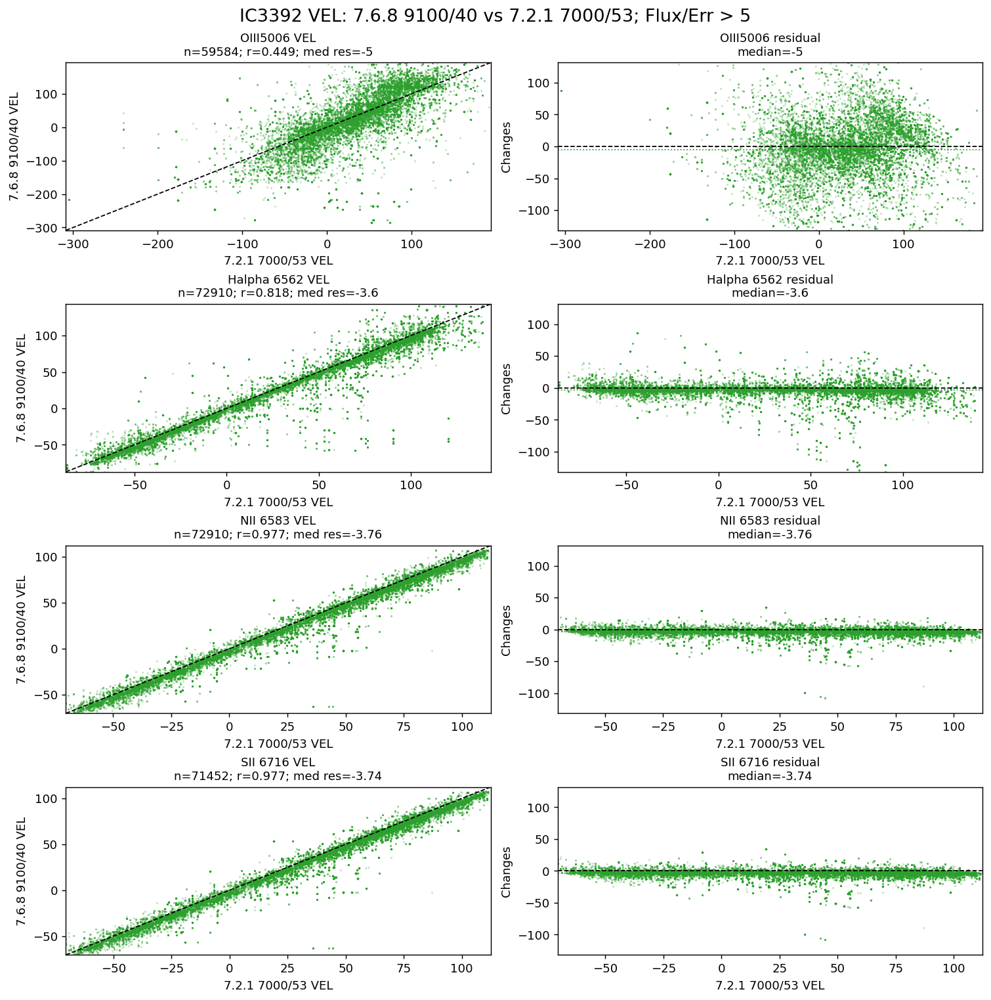

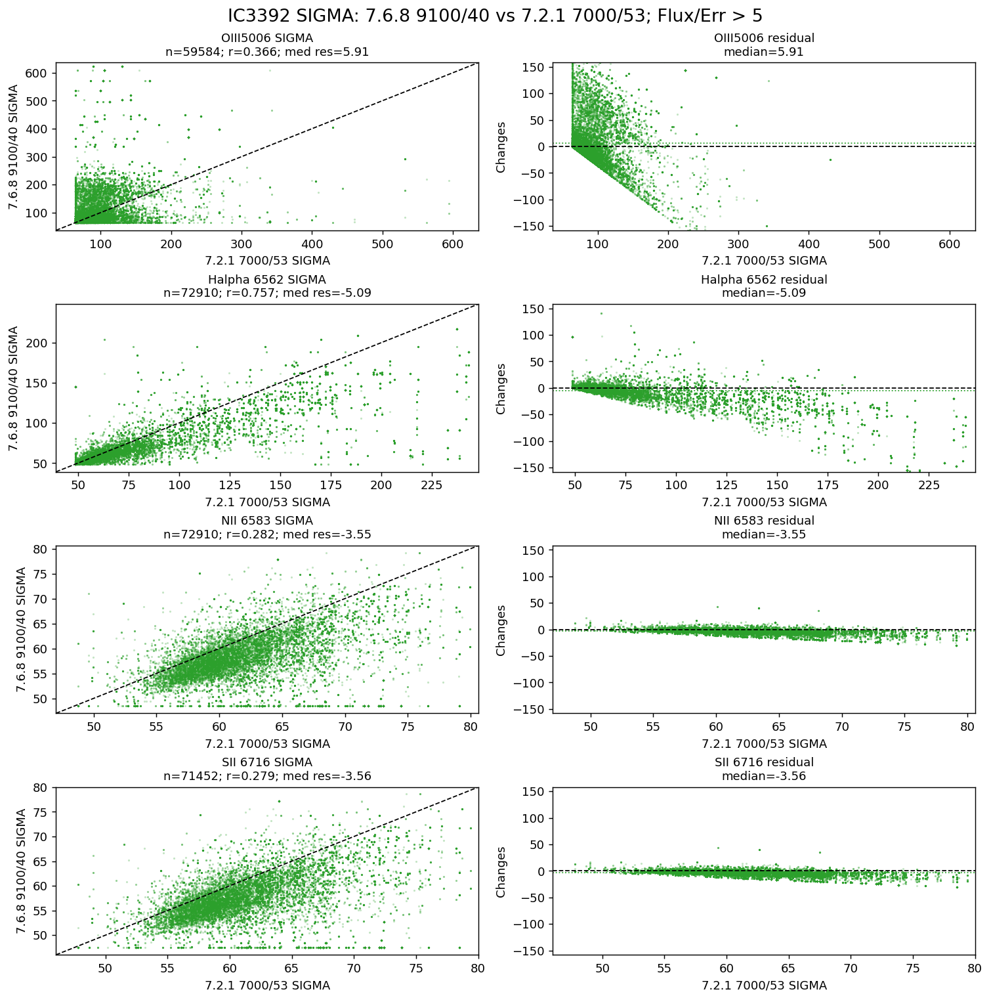

In [10]:
INDIVIDUAL_FLUXERR_CUT = 5
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 10


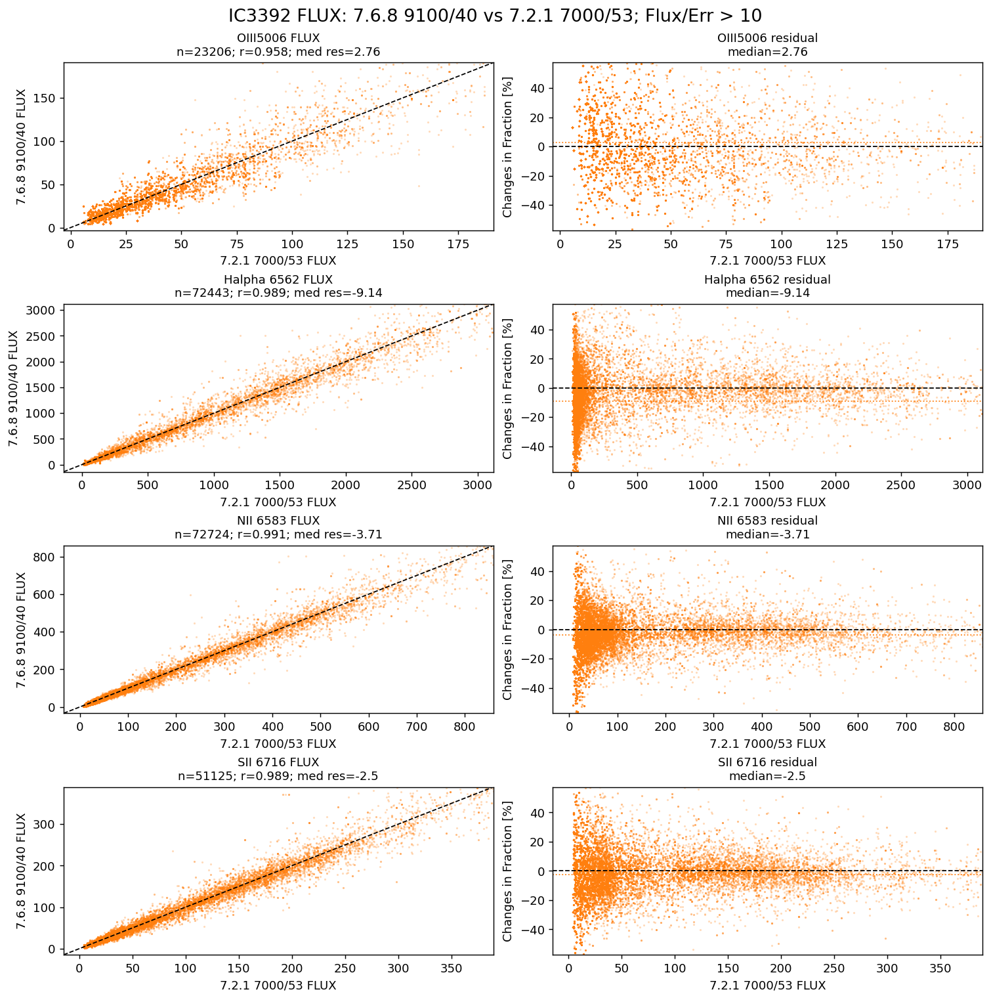

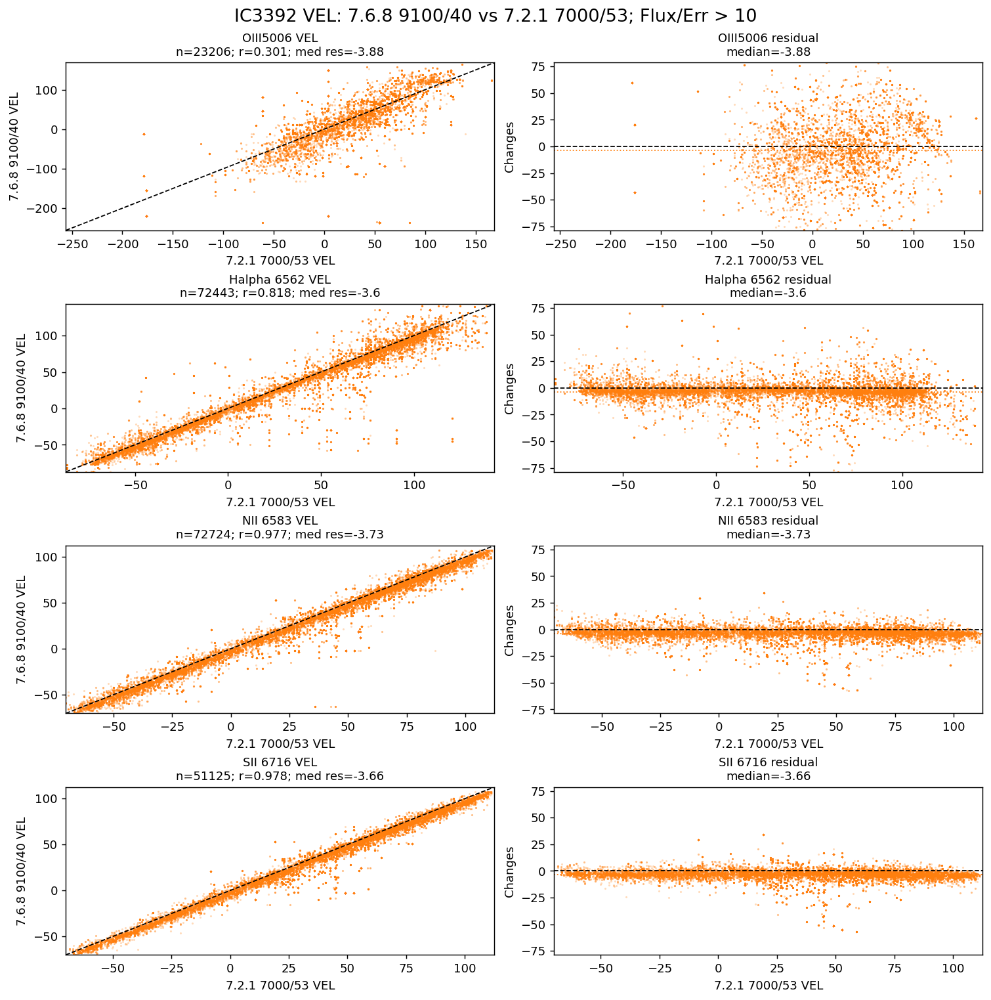

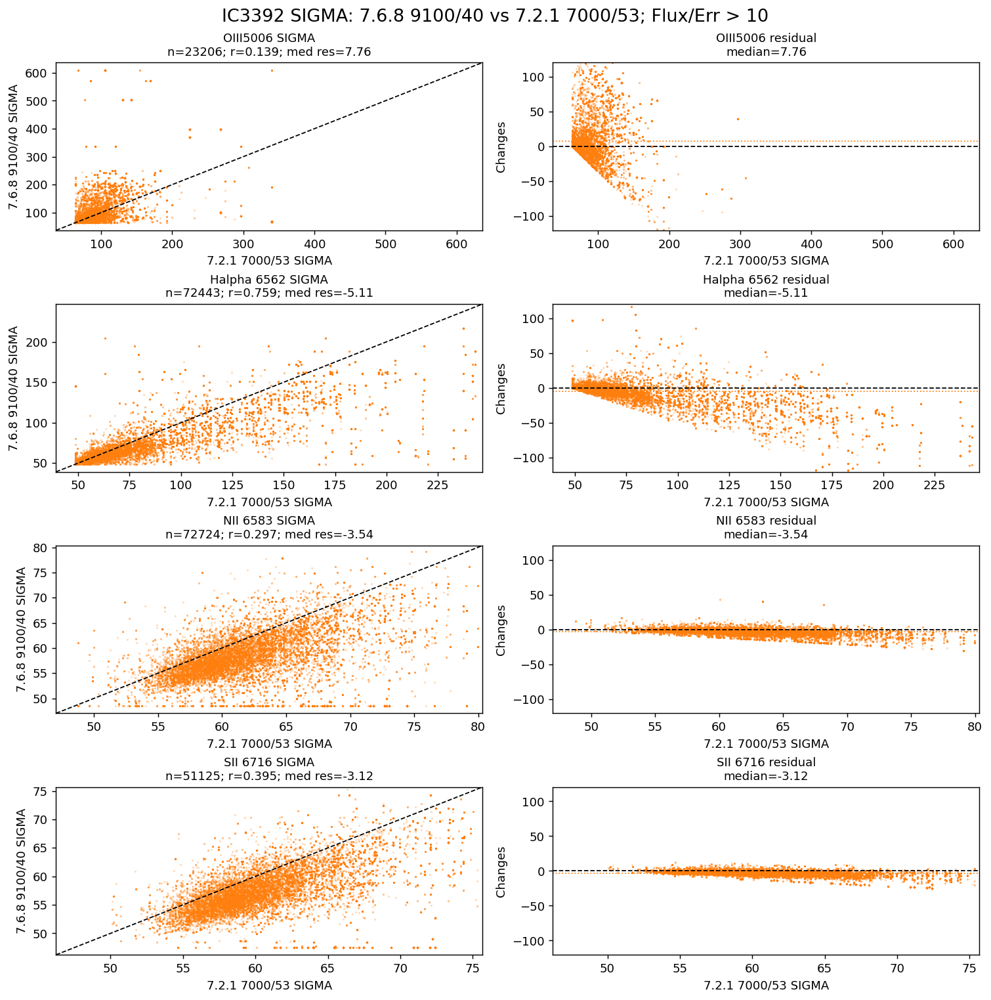

In [11]:
INDIVIDUAL_FLUXERR_CUT = 10
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 20


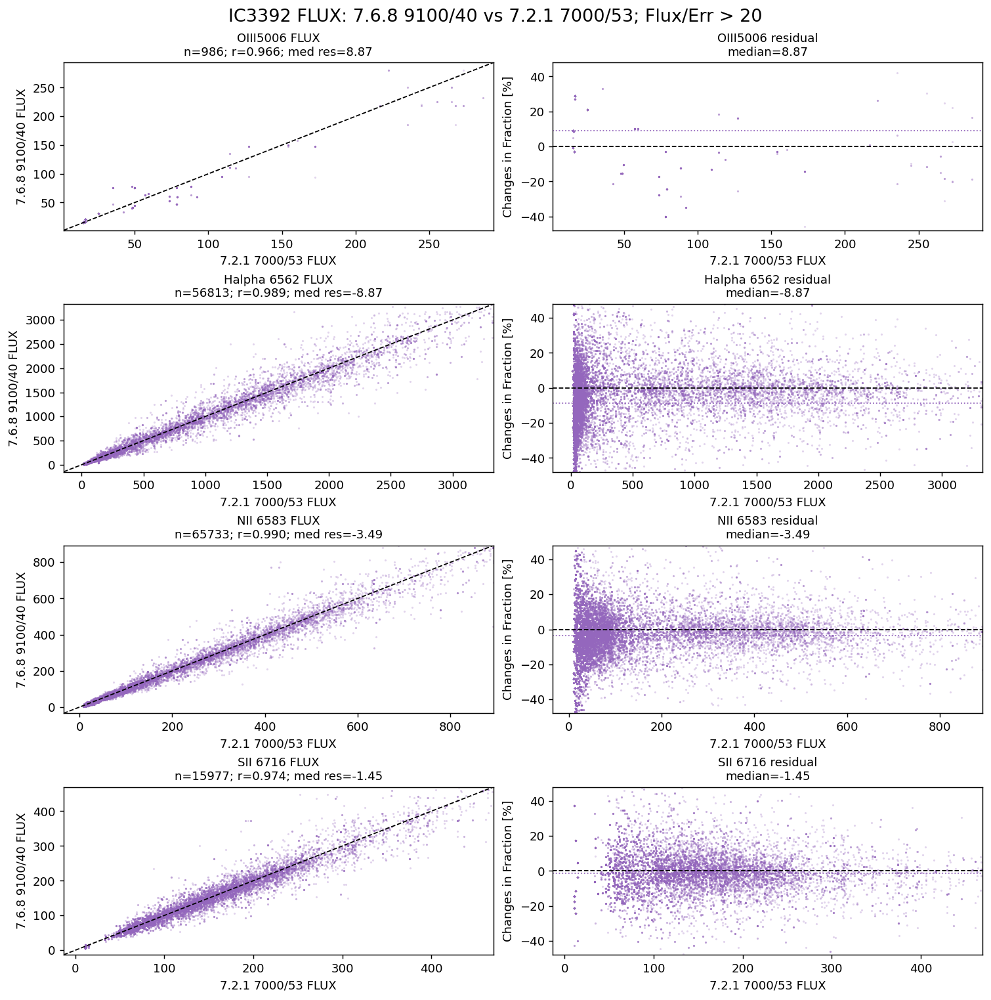

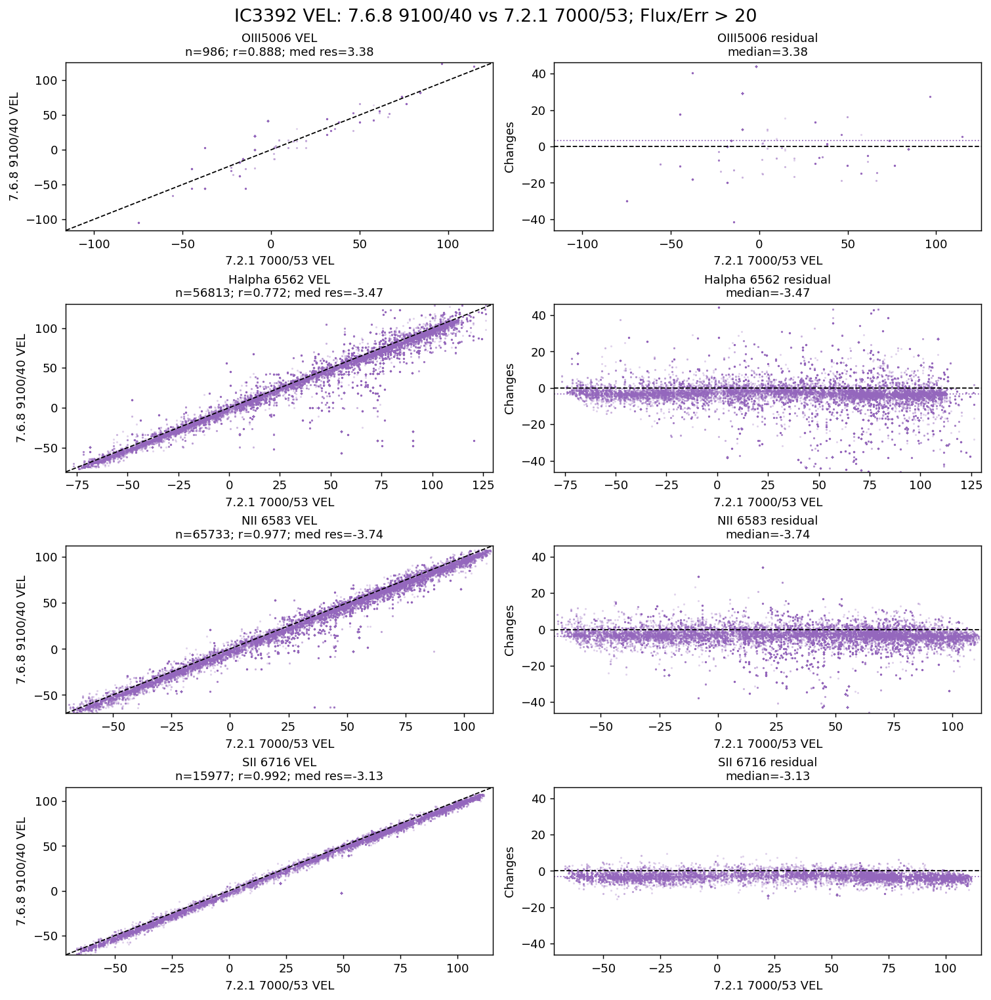

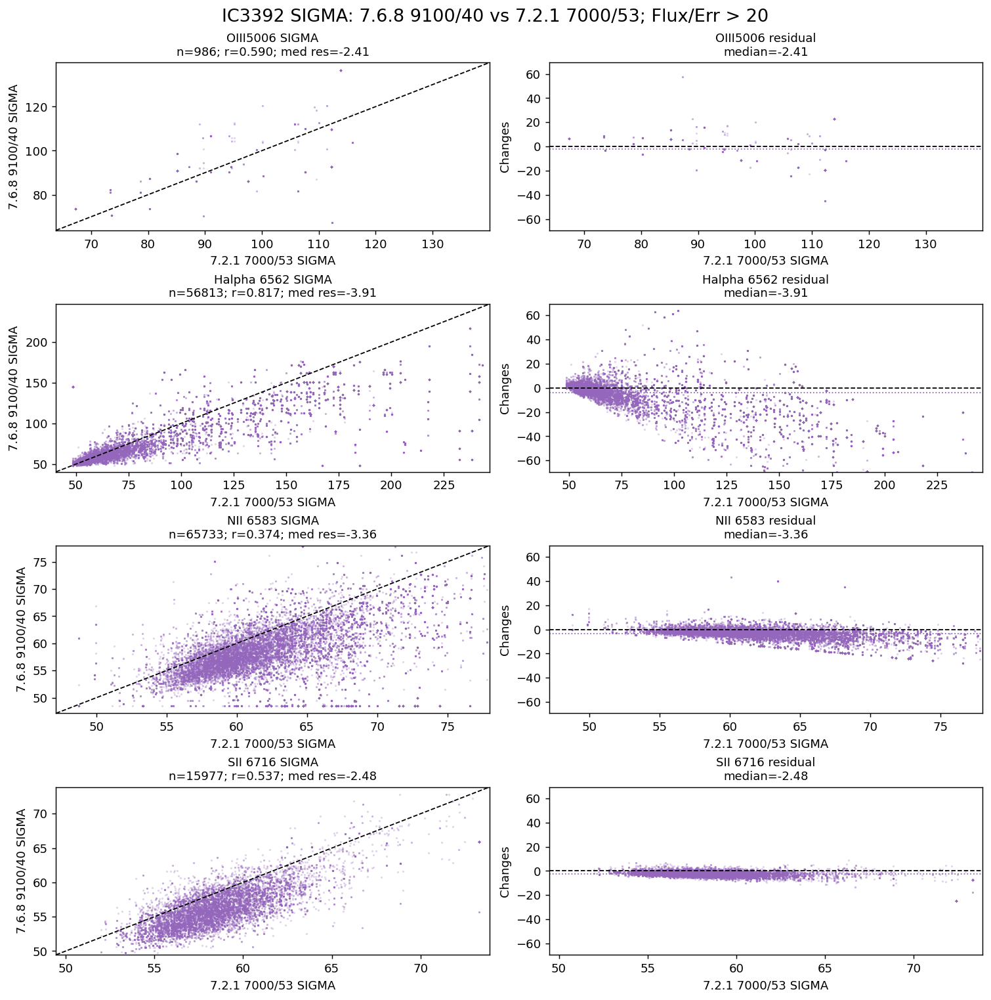

In [12]:
INDIVIDUAL_FLUXERR_CUT = 20
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 50


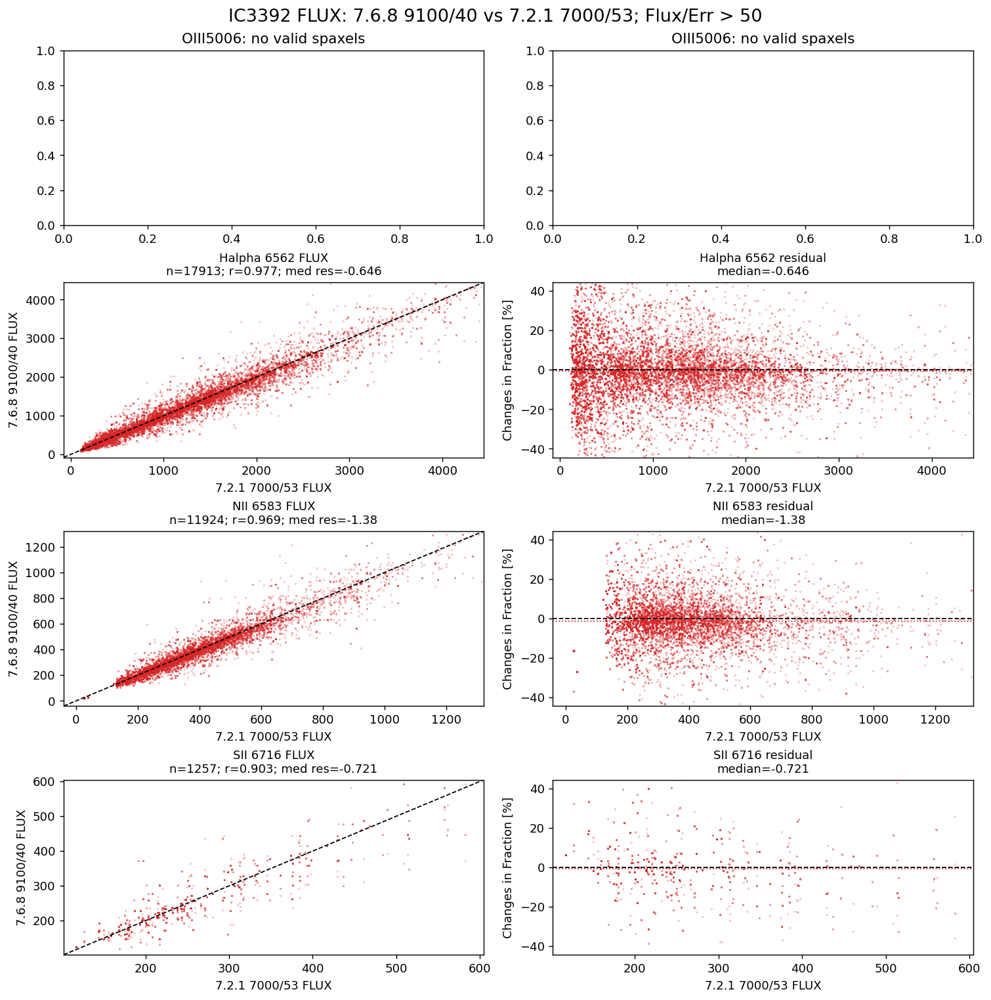

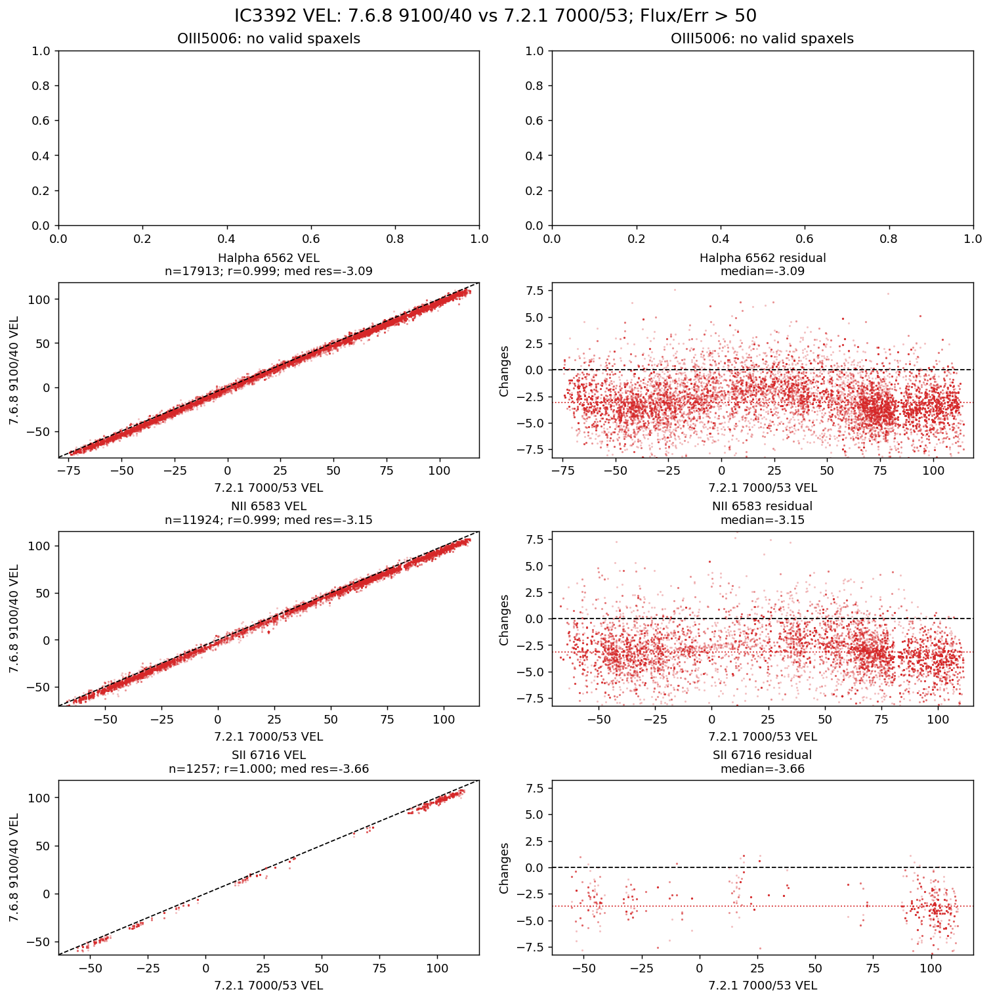

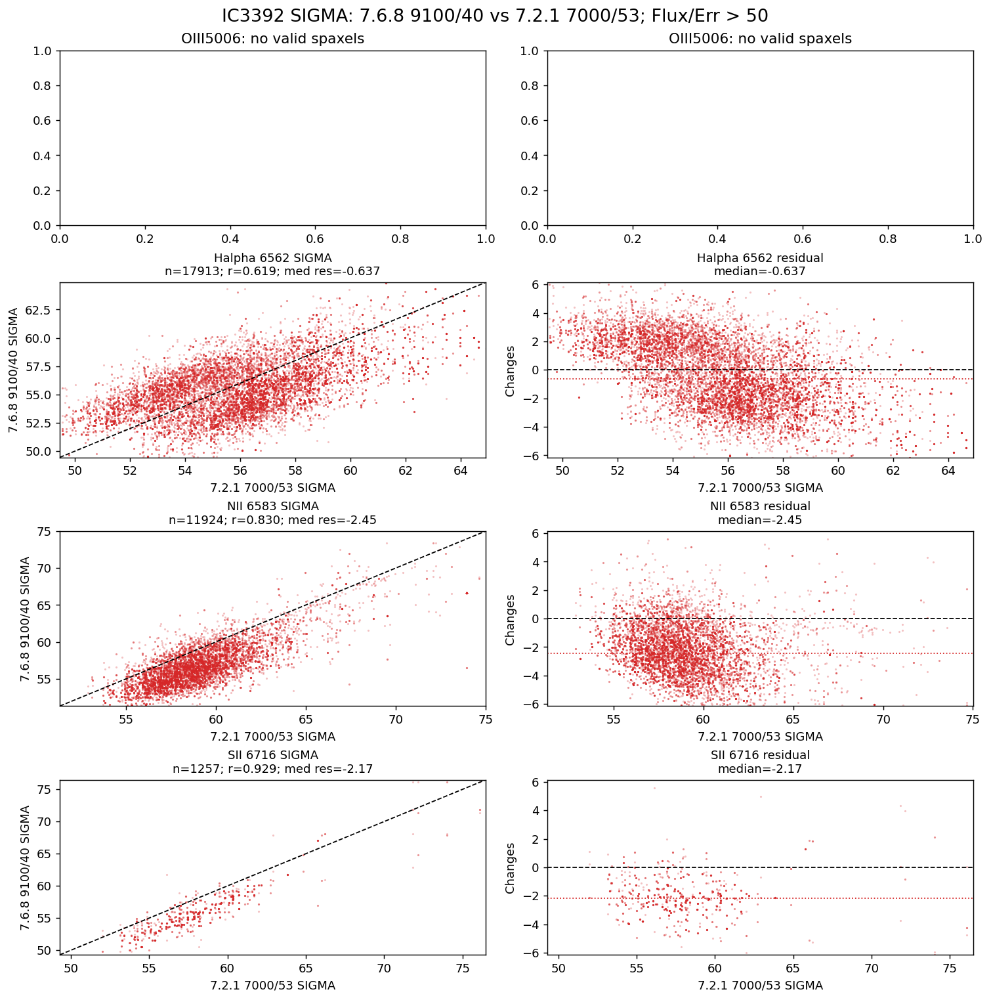

In [13]:
INDIVIDUAL_FLUXERR_CUT = 50
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


## Quantitative SIGMA Boundary Check

This section tests the lower-envelope interpretation directly. If the lower boundary in the `SIGMA` residual plot is caused by an effective minimum dispersion in the `9100/40` run, then with

`Changes = SIGMA_9100_40 - SIGMA_7000_53`

we expect the lower envelope to follow approximately

`Changes = -SIGMA_7000_53 + SIGMA_floor`.

So the fitted envelope slope should be close to `-1`, and the intercept should be comparable to the effective floor. Here the comparison floor is taken directly from each line's `v768_9100_40` `*_SIGMA_CORR` HDU, for example `OIII5006_SIGMA_CORR`, `HA6562_SIGMA_CORR`, `NII6583_SIGMA_CORR`, and `SII6716_SIGMA_CORR`.


In [14]:
SIGMA_BOUNDARY_CUTS = [None, 0, 3, 5, 10, 20, 50]
LOWER_ENVELOPE_PERCENTILE = 2
SIGMA_BOUNDARY_N_BINS = 18
SIGMA_BOUNDARY_MIN_PER_BIN = 20


def sigma_corr_hdu_summary(line):
    values = maps[f'{line}_SIGMA_CORR'][COMPARE_RUN]
    values = values[np.isfinite(values)]
    if values.size == 0:
        return {
            'sigma_corr_hdu_n': 0,
            'sigma_corr_hdu_median': np.nan,
            'sigma_corr_hdu_p16': np.nan,
            'sigma_corr_hdu_p84': np.nan,
        }
    return {
        'sigma_corr_hdu_n': int(values.size),
        'sigma_corr_hdu_median': float(np.nanmedian(values)),
        'sigma_corr_hdu_p16': float(np.nanpercentile(values, 16)),
        'sigma_corr_hdu_p84': float(np.nanpercentile(values, 84)),
    }


def lower_envelope_points(x, residual, n_bins=SIGMA_BOUNDARY_N_BINS, lower_percentile=LOWER_ENVELOPE_PERCENTILE, min_per_bin=SIGMA_BOUNDARY_MIN_PER_BIN):
    x = np.asarray(x, dtype=float)
    residual = np.asarray(residual, dtype=float)
    valid = np.isfinite(x) & np.isfinite(residual)
    x = x[valid]
    residual = residual[valid]
    if x.size < 2 * min_per_bin:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=int)

    edges = np.nanpercentile(x, np.linspace(2, 98, n_bins + 1))
    edges = np.unique(edges[np.isfinite(edges)])
    if edges.size < 3:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=int)

    env_x = []
    env_y = []
    env_n = []
    for i in range(edges.size - 1):
        if i == edges.size - 2:
            in_bin = (x >= edges[i]) & (x <= edges[i + 1])
        else:
            in_bin = (x >= edges[i]) & (x < edges[i + 1])
        if in_bin.sum() < min_per_bin:
            continue
        env_x.append(np.nanmedian(x[in_bin]))
        env_y.append(np.nanpercentile(residual[in_bin], lower_percentile))
        env_n.append(int(in_bin.sum()))
    return np.array(env_x), np.array(env_y), np.array(env_n)


def sigma_boundary_record(line, snr_cut):
    x, y, mask = pair_arrays(line, 'SIGMA', snr_cut)
    residual = residual_values(x, y, 'SIGMA')
    finite = np.isfinite(x) & np.isfinite(y) & np.isfinite(residual)
    x = x[finite]
    y = y[finite]
    residual = residual[finite]

    record = {
        'line': line,
        'line_label': LINE_LABELS[line],
        'fluxerr_cut': 'none' if snr_cut is None else f'>{snr_cut:g}',
        'n_valid': int(x.size),
        'n_envelope_bins': 0,
        'envelope_slope': np.nan,
        'slope_plus_one': np.nan,
        'envelope_intercept': np.nan,
        'fixed_slope_minus1_intercept': np.nan,
        'compare_sigma_min': np.nan,
        'compare_sigma_p01': np.nan,
        'compare_sigma_p05': np.nan,
        'fixed_intercept_minus_sigma_corr_hdu': np.nan,
        'envelope_intercept_minus_sigma_corr_hdu': np.nan,
    }
    record.update(sigma_corr_hdu_summary(line))

    if x.size == 0:
        return record

    record.update({
        'compare_sigma_min': float(np.nanmin(y)),
        'compare_sigma_p01': float(np.nanpercentile(y, 1)),
        'compare_sigma_p05': float(np.nanpercentile(y, 5)),
    })

    env_x, env_y, env_n = lower_envelope_points(x, residual)
    record['n_envelope_bins'] = int(env_x.size)
    if env_x.size >= 2:
        slope, intercept = np.polyfit(env_x, env_y, deg=1)
        fixed_intercept = np.nanmedian(env_y + env_x)
        record.update({
            'envelope_slope': float(slope),
            'slope_plus_one': float(slope + 1.0),
            'envelope_intercept': float(intercept),
            'fixed_slope_minus1_intercept': float(fixed_intercept),
        })
        sigma_corr_hdu = record['sigma_corr_hdu_median']
        if np.isfinite(sigma_corr_hdu):
            record['fixed_intercept_minus_sigma_corr_hdu'] = float(fixed_intercept - sigma_corr_hdu)
            record['envelope_intercept_minus_sigma_corr_hdu'] = float(intercept - sigma_corr_hdu)
    return record


sigma_boundary_summary = pd.DataFrame([
    sigma_boundary_record(line, cut)
    for line in LINE_ORDER
    for cut in SIGMA_BOUNDARY_CUTS
])

sigma_boundary_columns = [
    'line', 'fluxerr_cut', 'n_valid', 'n_envelope_bins',
    'envelope_slope', 'slope_plus_one', 'envelope_intercept', 'fixed_slope_minus1_intercept',
    'sigma_corr_hdu_median', 'sigma_corr_hdu_p16', 'sigma_corr_hdu_p84',
    'fixed_intercept_minus_sigma_corr_hdu', 'envelope_intercept_minus_sigma_corr_hdu',
    'compare_sigma_min', 'compare_sigma_p01', 'compare_sigma_p05',
]
display(sigma_boundary_summary[sigma_boundary_columns])

print('Rule of thumb: slope_plus_one near 0 supports a -1 lower envelope; intercept-minus-SIGMA_CORR near 0 supports the line-specific SIGMA_CORR/floor interpretation.')


,line,fluxerr_cut,n_valid,n_envelope_bins,envelope_slope,slope_plus_one,envelope_intercept,fixed_slope_minus1_intercept,sigma_corr_hdu_median,sigma_corr_hdu_p16,sigma_corr_hdu_p84,fixed_intercept_minus_sigma_corr_hdu,envelope_intercept_minus_sigma_corr_hdu,compare_sigma_min,compare_sigma_p01,compare_sigma_p05
0,OIII5006,none,72910,16,-1.187057,-0.187057,80.085439,62.883366,63.817502,63.817502,63.817502,-0.934136,16.267937,63.818755,63.818755,63.818755
1,OIII5006,>0,71914,16,-1.188235,-0.188235,80.241110,62.892344,63.817502,63.817502,63.817502,-0.925158,16.423608,63.818755,63.818755,63.818755
2,OIII5006,>3,68258,17,-1.184547,-0.184547,79.619452,62.974620,63.817502,63.817502,63.817502,-0.842882,15.801950,63.818755,63.818755,63.818755
3,OIII5006,>5,59584,17,-1.189515,-0.189515,80.268601,62.572850,63.817502,63.817502,63.817502,-1.244652,16.451099,63.818755,63.818755,63.818755
4,OIII5006,>10,23206,18,-1.199338,-0.199338,84.864505,63.476987,63.817502,63.817502,63.817502,-0.340515,21.047004,63.818755,63.818755,64.554954
5,OIII5006,>20,986,9,-0.693515,0.306485,52.697989,81.130594,63.817502,63.817502,63.817502,17.313092,-11.119513,67.464929,70.338880,73.502435
6,OIII5006,>50,0,0,NaN,NaN,NaN,NaN,63.817502,63.817502,63.817502,NaN,NaN,NaN,NaN,NaN
7,HA6562,none,72910,18,-0.950627,0.049373,49.668885,51.363593,48.687223,48.687223,48.687223,2.676370,0.981662,48.688866,48.688866,51.909168
8,HA6562,>0,72910,18,-0.950627,0.049373,49.668885,51.363593,48.687223,48.687223,48.687223,2.676370,0.981662,48.688866,48.688866,51.909168
9,HA6562,>3,72910,18,-0.950627,0.049373,49.668885,51.363593,48.687223,48.687223,48.687223,2.676370,0.981662,48.688866,48.688866,51.909168


Rule of thumb: slope_plus_one near 0 supports a -1 lower envelope; intercept-minus-SIGMA_CORR near 0 supports the line-specific SIGMA_CORR/floor interpretation.


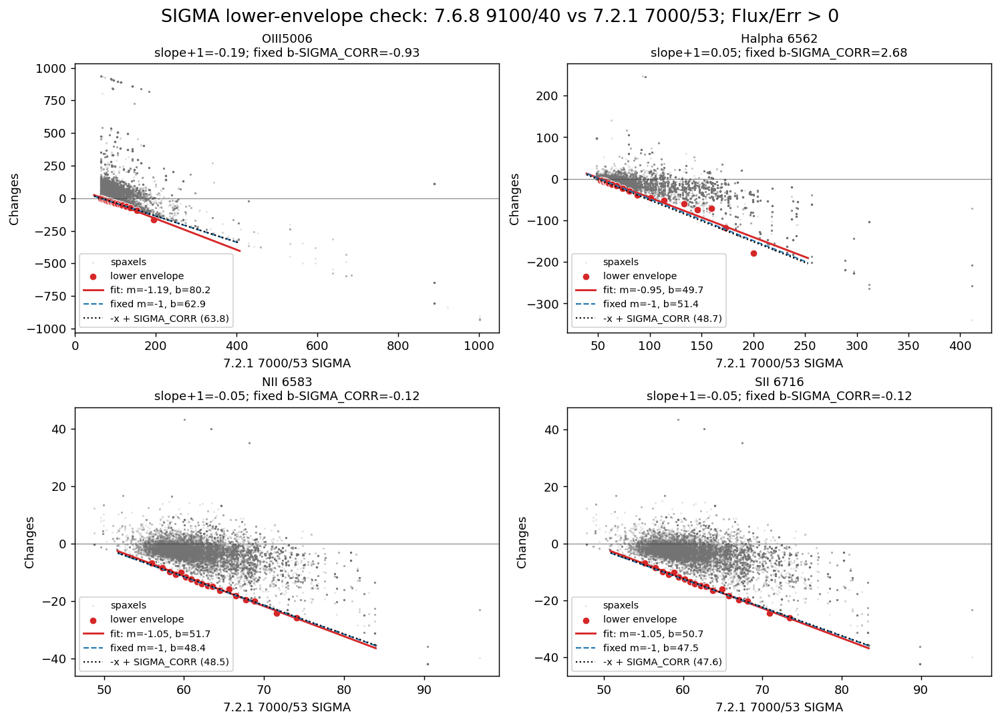

In [15]:
def plot_sigma_boundary_verification(snr_cut=0, max_points=25000, random_state=210):
    fig, axes = plt.subplots(2, 2, figsize=(11.4, 8.2), squeeze=False, constrained_layout=True)
    fig.suptitle(
        f'SIGMA lower-envelope check: {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}; {cut_label(snr_cut)}',
        fontsize=15,
    )

    for ax, line in zip(axes.ravel(), LINE_ORDER):
        x, y, _ = pair_arrays(line, 'SIGMA', snr_cut)
        residual = residual_values(x, y, 'SIGMA')
        finite = np.isfinite(x) & np.isfinite(y) & np.isfinite(residual)
        x = x[finite]
        y = y[finite]
        residual = residual[finite]
        if x.size == 0:
            ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        px, pres = sample_for_plot(x, residual, max_points=max_points, random_state=random_state)
        ax.scatter(px, pres, s=3, alpha=0.18, linewidths=0, color='0.45', label='spaxels')

        env_x, env_y, env_n = lower_envelope_points(x, residual)
        if env_x.size:
            ax.scatter(env_x, env_y, s=35, color='tab:red', edgecolor='white', linewidth=0.5, label='lower envelope')

        xx = np.linspace(*robust_limits(x, p=(1, 99)), 100)
        row = sigma_boundary_record(line, snr_cut)
        if np.isfinite(row['envelope_slope']) and np.isfinite(row['envelope_intercept']):
            ax.plot(
                xx,
                row['envelope_slope'] * xx + row['envelope_intercept'],
                color='tab:red',
                linewidth=1.6,
                label=f"fit: m={row['envelope_slope']:.2f}, b={row['envelope_intercept']:.1f}",
            )
        if np.isfinite(row['fixed_slope_minus1_intercept']):
            ax.plot(
                xx,
                -xx + row['fixed_slope_minus1_intercept'],
                color='tab:blue',
                linewidth=1.2,
                linestyle='--',
                label=f"fixed m=-1, b={row['fixed_slope_minus1_intercept']:.1f}",
            )
        if np.isfinite(row['sigma_corr_hdu_median']):
            ax.plot(
                xx,
                -xx + row['sigma_corr_hdu_median'],
                color='black',
                linewidth=1.2,
                linestyle=':',
                label=f"-x + SIGMA_CORR ({row['sigma_corr_hdu_median']:.1f})",
            )

        ax.axhline(0, color='0.2', linestyle='-', linewidth=0.7, alpha=0.55)
        ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} SIGMA')
        ax.set_ylabel('Changes')
        ax.set_title(
            f'{LINE_LABELS[line]}\n'
            f"slope+1={row['slope_plus_one']:.2f}; fixed b-SIGMA_CORR={row['fixed_intercept_minus_sigma_corr_hdu']:.2f}",
            fontsize=10,
        )
        ax.legend(loc='lower left', fontsize=8, frameon=True)

    plt.show()


SIGMA_BOUNDARY_PLOT_CUT = 0
plot_sigma_boundary_verification(SIGMA_BOUNDARY_PLOT_CUT)


## Observation And Interpretation

From the pairwise plots, the `FLUX` comparison remains scattered at all tested `Flux/Err` cuts. Even the high-`Flux/Err` groups do not collapse onto a clean 1:1 relation in the same way as the kinematic quantities. This suggests that the flux differences between `9100/40` and the old `7000/53` reference are not controlled only by low-S/N spaxels. They may also reflect differences in continuum subtraction, wavelength range, line fitting, or the way the two runs distribute flux between nearby/tied components.

For `VEL` and `SIGMA`, the trend is clearer: higher `Flux/Err` cuts produce a tighter 1:1 relation. This supports the idea that the kinematic comparison is strongly S/N dependent. Low-`Flux/Err` spaxels add much of the scatter, while high-`Flux/Err` spaxels isolate the more stable part of the gas solution.

The `SIGMA` residual plots also show a boundary-like feature, which the quantitative check above is designed to test. In the residual view, the y axis is

`Changes = SIGMA_9100_40 - SIGMA_7000_53`

and the x axis is `SIGMA_7000_53`. The lower envelope appears to follow a diagonal relation like `y = -k x - b`, or more simply a near `-1` slope boundary. A plausible interpretation is that this boundary is set by a lower allowed velocity-dispersion floor in the comparison run. If the fitted or corrected dispersion in `9100/40` cannot fall below some effective minimum value, then

`SIGMA_9100_40 >= SIGMA_floor`

which implies

`SIGMA_9100_40 - SIGMA_7000_53 >= SIGMA_floor - SIGMA_7000_53`.

That naturally appears as a lower residual envelope with slope close to `-1`. This is consistent with the suspicion that the boundary may be related to the minimum allowed/physical velocity dispersion, possibly tied to the line-specific `SIGMA_CORR` value, instrumental broadening correction, or the fitting code's lower sigma constraint for each emission line. This should still be treated as a hypothesis unless the fitted lower-envelope slopes are close to `-1` and the fitted intercepts are close to the per-line `9100/40` `*_SIGMA_CORR` HDU values in `sigma_boundary_summary`.


## Optional Save


In [16]:
# no_cut_summary.to_csv('IC3392_9100_40_vs_7000_no_fluxerr_cut_summary_20260507.csv', index=False)
# cut_summary.to_csv('IC3392_9100_40_vs_7000_fluxerr_cut_summary_20260507.csv', index=False)
